# Additional Clustering Method : Self Organized Map Simple Clustering

As additional Clustering method we choose to use SOM, Self Organized Map, an unsupervised machine learning technique used to produce a low-dimensional (typically two-dimensional) representation of a higher dimensional data set while preserving the topological structure of the data, this low-dimensional representation is a lattice with a predefined set of nodes (parameter K) that during the learning try to adapt and represent the training data.

https://en.wikipedia.org/wiki/Self-organizing_map

The som low-dimension representation take the nodes of the lattice as centroid of clusters.

In [1]:
%matplotlib inline

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import silhouette_score
from tqdm import tqdm
from sklearn.decomposition import PCA
from sklearn import metrics
from pyclustering.cluster.somsc import somsc
from clustering_utils import *

## Load the Data

In [2]:
df = pd.read_csv("dataset/cleaned_user_profiles.csv", index_col=0)

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11508 entries, 2353593986 to 933183398
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   name                    11508 non-null  object 
 1   lang                    11508 non-null  object 
 2   bot                     11508 non-null  int64  
 3   created_at              11508 non-null  object 
 4   statuses_count          11508 non-null  int64  
 5   avg_length              11508 non-null  float64
 6   avg_special_chars       11508 non-null  float64
 7   urls_ratio              11508 non-null  float64
 8   mentions_ratio          11508 non-null  float64
 9   hashtags_ratio          11508 non-null  float64
 10  reply_count_mean        11508 non-null  float64
 11  reply_count_std         11508 non-null  float64
 12  favorite_count_mean     11508 non-null  float64
 13  favorite_count_std      11508 non-null  float64
 14  favorite_count_entropy  1

loaded the data, we separate the numerical features (used to run the clustering algorithms) and the categorical ones (used to understand the results of the clustering algorithms)

In [4]:
# remove categorical features
cat_features = ["name", "lang", "bot", "created_at"]
df_cat = df[cat_features]
df_num = df.loc[:, ~df.columns.isin(cat_features)]

In [5]:
df_cat.head()

,name,lang,bot,created_at
2353593986,Lamonica Raborn,en,1,2019-02-22 18:00:42
2358850842,Lourie Botton,en,0,2019-02-26 03:02:32
137959629,Dadan Syarifudin,en,1,2015-04-30 07:09:56
466124818,Carletto Focia,it,1,2017-01-18 02:49:18
2571493866,MBK Ebook,en,0,2019-06-18 19:30:21


In [6]:
df_num.head()

,statuses_count,avg_length,avg_special_chars,urls_ratio,mentions_ratio,hashtags_ratio,reply_count_mean,reply_count_std,favorite_count_mean,favorite_count_std,favorite_count_entropy,retweet_count_mean,retweet_count_std
2353593986,76,62.340909,14.015152,0.000000,0.272727,0.098485,0.0,0.0,0.037879,0.190903,0.232481,0.037879,0.190903
2358850842,54,69.082645,15.041322,0.000000,0.338843,0.024793,0.0,0.0,0.049587,0.217090,0.284639,0.024793,0.155495
137959629,53,65.340909,14.694444,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
466124818,50,86.944871,18.689463,0.022331,0.006281,0.072575,0.0,0.0,0.165387,0.530838,0.669155,0.826239,13.034008
2571493866,7085,72.311246,14.582073,0.000825,0.506461,0.118229,0.0,0.0,0.056365,0.243387,0.317182,0.016772,0.142619


## Preprocessing

First apply the log scale of the feature with a skewed distribution (see DataProfileUnderstanding.ipynb), following the results presented in data understanding of the profiling.

In [7]:
# TODO : Review the DataUnderstandingProfiling

skewed_features = [
    "statuses_count",
    "avg_special_chars",
    "urls_ratio",
    "mentions_ratio",
    "hashtags_ratio",
    "reply_count_mean",
    "reply_count_std",
    "favorite_count_mean",
    "favorite_count_std",
    "retweet_count_mean",
    "retweet_count_std"]

df_num_not_skewed = preprocess_skewed_features(df_num, skewed_features)

Apply Standard Scaling as preprocessing step

In [8]:
scaler = StandardScaler()

In [9]:
X = scaler.fit_transform(df_num_not_skewed.values)

## Apply SOMC

First define some utilites doesn't present in the PyClustering Library

In [10]:
def som_get_centroids(clusters, X):
    som_clusters = list()
    for cluster in clusters:
        x_ = np.zeros(X.shape[1])
        for i in cluster:
            x_ += X[i]
        x_ /= len(cluster)
        
        som_clusters.append(x_)
    return np.array(som_clusters)

In [11]:
def som_sse(som_sc, X, som_labels):
    clusters = somsc_instance.get_clusters()

    som_centroids = som_get_centroids(clusters, X)
    
    curr_sse = 0
    
    # calculate square of Euclidean distance of each point from its cluster center and add to current WSS
    for i in range(X.shape[0]):
        curr_center = som_centroids[som_labels[i]]
        curr_sse += np.linalg.norm(X[i] - curr_center)**2
                
    return curr_sse

As done for the Kmeans clustering, for max_k iteration try different values of the K parameter, select out the best with respect to the SSE, Separation and Silouettes curves.

In [12]:
som_sses = list()
som_separations = list()
som_silouettes = list()

max_k = 25

for k in tqdm(range(2, max_k+1)):
    # Create instance of SOM-SC algorithm to allocated two clusters
    somsc_instance = somsc(X, k, epouch=150)

    # Run cluster analysis and obtain results
    somsc_instance.process()
    
    som_labels = np.array(somsc_instance.predict(X))

    som_sses.append(som_sse(somsc_instance, X, som_labels))
    som_separations.append(metrics.davies_bouldin_score(X, som_labels))
    som_silouettes.append(silhouette_score(X, som_labels))

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [01:03<00:00,  2.63s/it]


Plotting SSE Curve

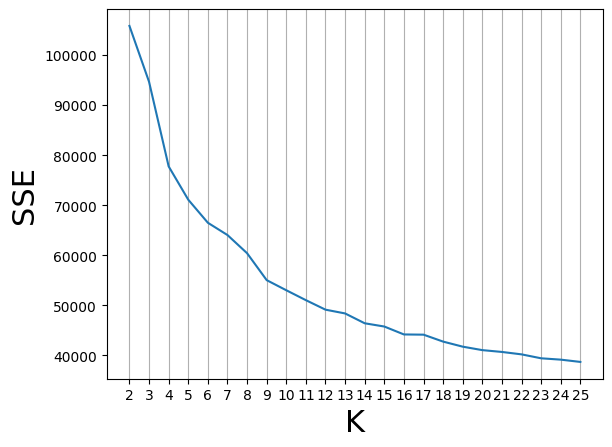

In [13]:
plt.plot(range(2, len(som_sses) + 2), som_sses)
plt.ylabel('SSE', fontsize=22)
plt.xlabel('K', fontsize=22)
plt.xticks(range(2, len(som_sses) + 2))
plt.grid(True, axis="x")
plt.savefig("images/clustering/som_sse.png")
plt.show()

Plotting Separation Curve

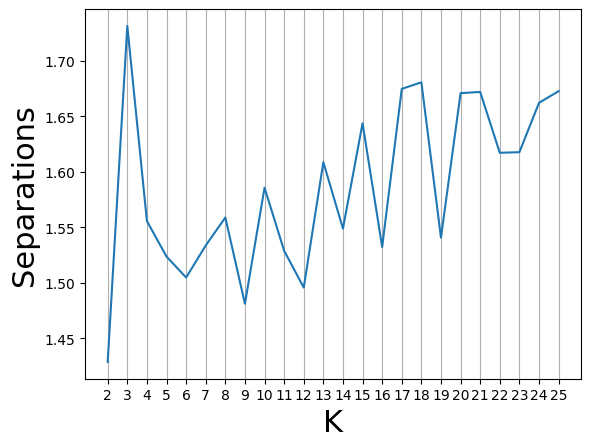

In [14]:
plt.plot(range(2, len(som_separations) + 2), som_separations)
plt.ylabel('Separations', fontsize=22)
plt.xlabel('K', fontsize=22)
plt.xticks(range(2, len(som_separations) + 2))
plt.grid(True, axis="x")
plt.savefig("images/clustering/som_separation.png")
plt.show()

Plotting Separation Curve

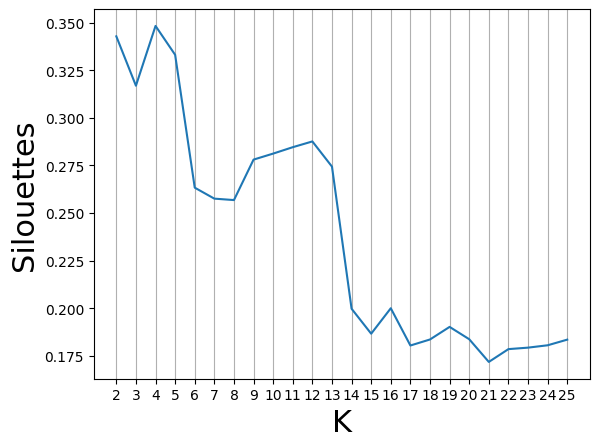

In [15]:
plt.plot(range(2, len(som_silouettes) + 2), som_silouettes)
plt.ylabel('Silouettes', fontsize=22)
plt.xlabel('K', fontsize=22)
plt.xticks(range(2, len(som_silouettes) + 2))
plt.grid(True, axis="x")
plt.savefig("images/clustering/som_silouettes.png")
plt.show()

Select out the best K, chose it properly using the plotted curves, we want the K that try to maximize the silouette, minimizing the Separation and the SSE at the same time.

In [27]:
selected_k=10

Get the Kmeans clustering with selected K

In [28]:
# Create instance of SOM-SC algorithm to allocated two clusters
somsc_instance = somsc(X, selected_k, epouch=150)
 
# Run cluster analysis and obtain results
somsc_instance.process()
clusters = somsc_instance.get_clusters()

som_clusters = som_get_centroids(clusters, X)
som_labels = np.array(somsc_instance.predict(X))

## Plot Cluster Results

Plot the centroids in a tabular way, to have a summary of the clusters

In [29]:
pd.DataFrame(som_clusters, columns=df_num.columns)

,statuses_count,avg_length,avg_special_chars,urls_ratio,mentions_ratio,hashtags_ratio,reply_count_mean,reply_count_std,favorite_count_mean,favorite_count_std,favorite_count_entropy,retweet_count_mean,retweet_count_std
0,1.411549,-0.968504,-1.002518,0.412713,1.183188,-0.297159,-0.228043,-0.344642,1.554943,1.627525,1.897618,1.150783,1.281948
1,1.255662,-0.738569,-0.780773,0.315394,0.875577,0.034139,-0.238779,-0.348985,0.059551,0.243670,0.053935,1.134303,1.318784
2,0.940598,1.014618,0.833144,1.971865,1.248940,0.727319,-0.230295,-0.327524,-0.012661,0.083130,0.029380,0.104253,1.419095
3,-0.468726,1.455390,1.257489,-0.138849,-0.921207,-0.225326,-0.236955,-0.347404,1.196369,1.374582,1.238903,0.328685,0.588607
4,1.268761,1.223068,0.988330,1.115873,1.250024,0.828584,-0.246888,-0.349826,1.271480,1.284852,1.251567,1.597632,1.264215
5,-0.556633,0.929192,0.957075,-0.323400,-0.952399,-0.801590,-0.233428,-0.339306,-0.640300,-0.705751,-0.706885,-0.342308,-0.529410
6,-0.582358,-0.561984,-0.363100,-0.129466,-0.946264,0.789488,-0.229907,-0.325593,-0.689460,-0.866734,-0.815519,-0.552128,-0.755921
7,-0.492555,-0.265062,-0.265668,-0.560608,0.066298,-0.354368,-0.250489,-0.349604,-0.307696,-0.342150,-0.296029,-0.531398,-0.703976
8,-0.634390,-0.336899,-0.121251,-0.118570,-0.951416,0.740567,-0.239005,3.259466,-0.542029,-0.671398,-0.737835,-0.540909,-0.751076
9,-0.587906,-0.396605,-0.172986,-0.167091,-0.991277,0.805488,3.746900,2.233303,-0.525307,-0.570173,-0.702538,-0.550221,-0.765495


In [30]:
som_centers = reverse_log_skewed(scaler.inverse_transform(som_clusters), df_num, skewed_features)

Plot the centroids coordinates in parallel and radar coordinates, we can see that the different centroids have values of the features that vary in the magnitude between different clusters, so each cluster represent a kind of behaviour different with respect the others.

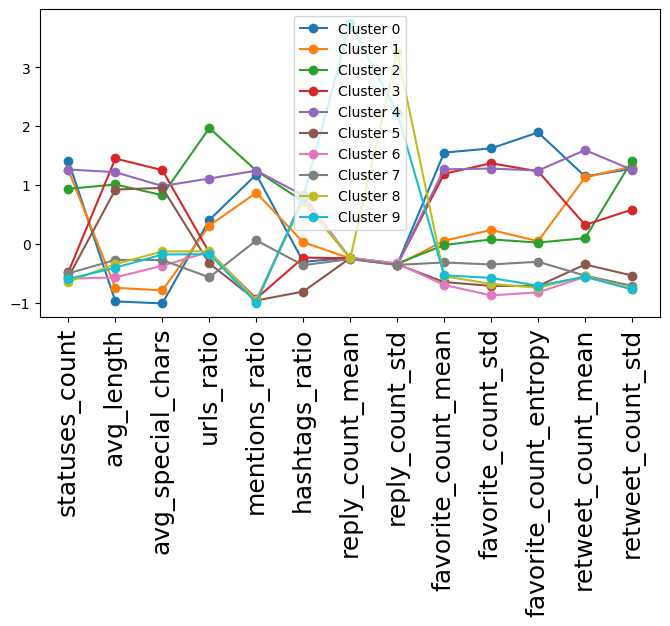

In [31]:
plot_parallel_coordinates_clusters(df_num, som_clusters, "som")

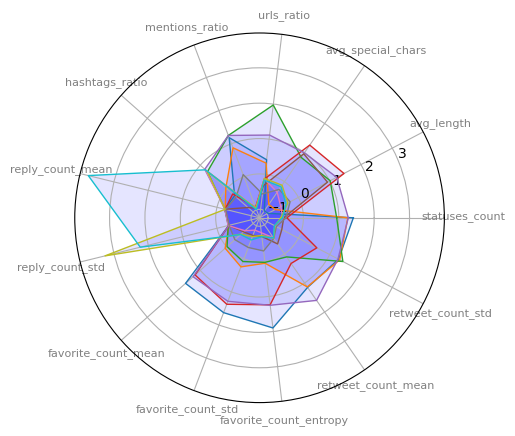

In [32]:
plot_radar_clusters(df_num, som_clusters, "som")

#### Distribution of CategoricalFeatures per Cluster

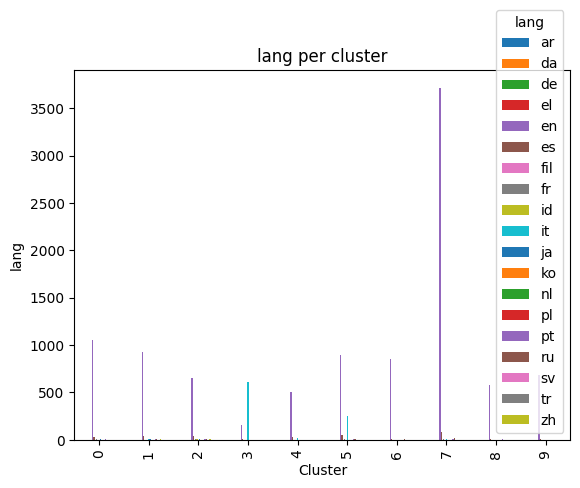

In [33]:
categorical_hist_clusters(df_cat, som_labels, "lang", "som")

Plot the distribution of bot and non-bot user per cluster, we can see that each cluster have a majority of one of the two classes, this is a simptom of the goodness of the cluster method, and the utility of the selected indicator choosen to describe an user profile.

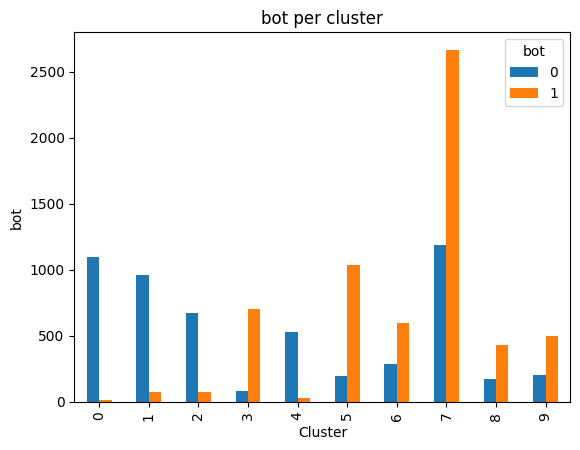

In [34]:
categorical_hist_clusters(df_cat, som_labels, "bot", "som")

Plot of the **created_at** feature (grouped by year) of the user in each cluster

0
1113


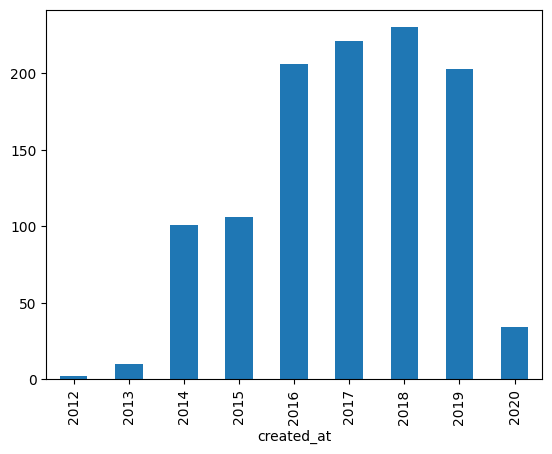

1
1035


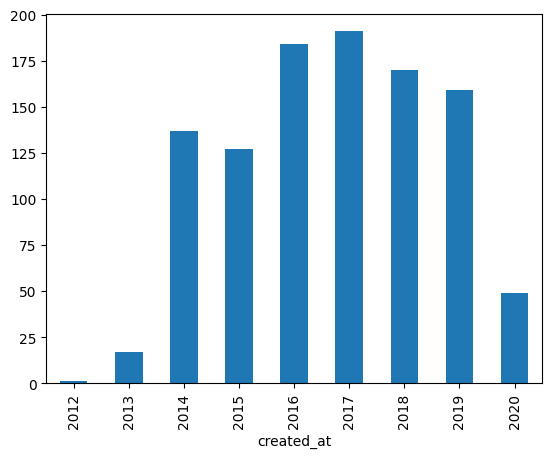

2
752


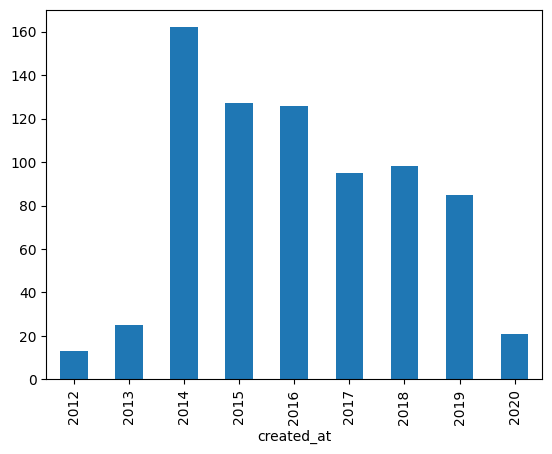

3
786


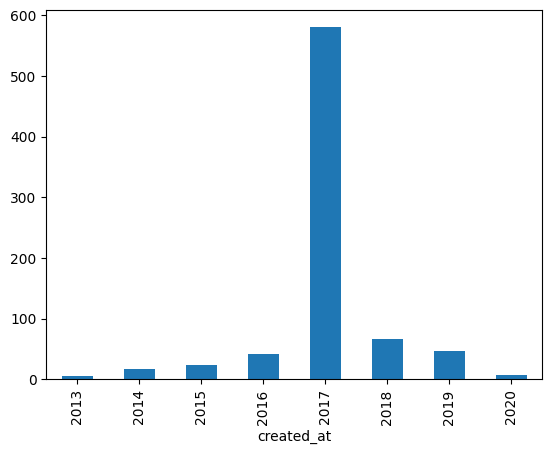

4
564


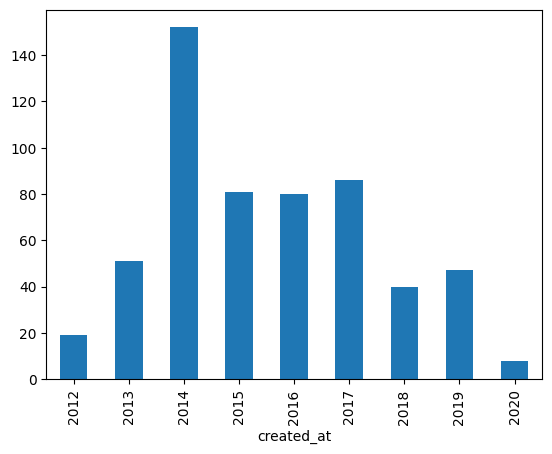

5
1226


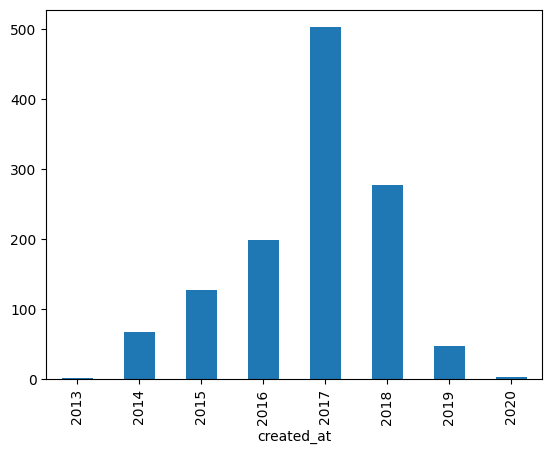

6
877


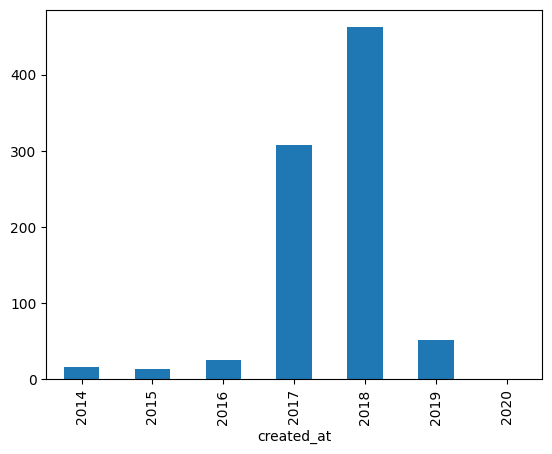

7
3853


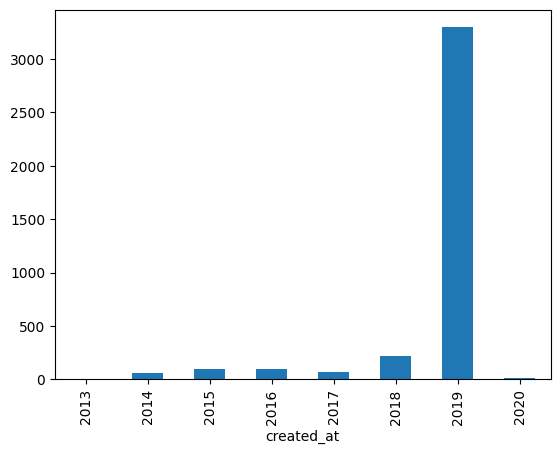

8
599


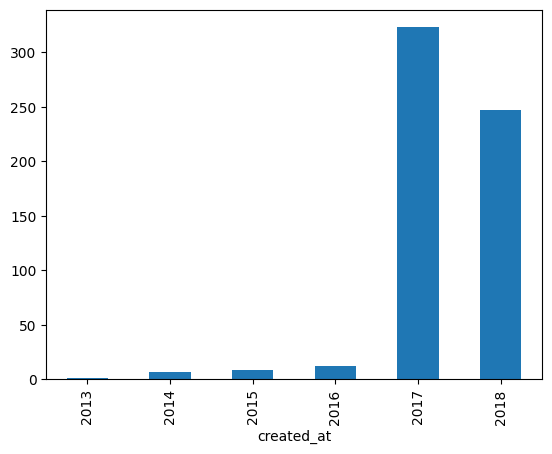

9
703


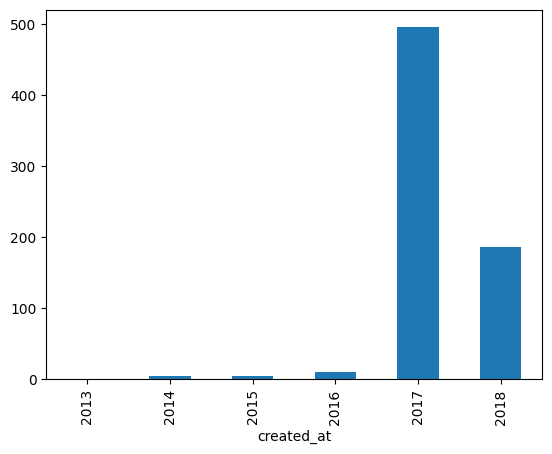

In [35]:
plot_date_feature_clusters(df_cat, som_labels, selected_k)

#### Distribution of Numerical Features per Cluster

We will plot the distribution of the variables in the original space, plotting the boxplots and histogram of each numerical feature for each discovered cluster.

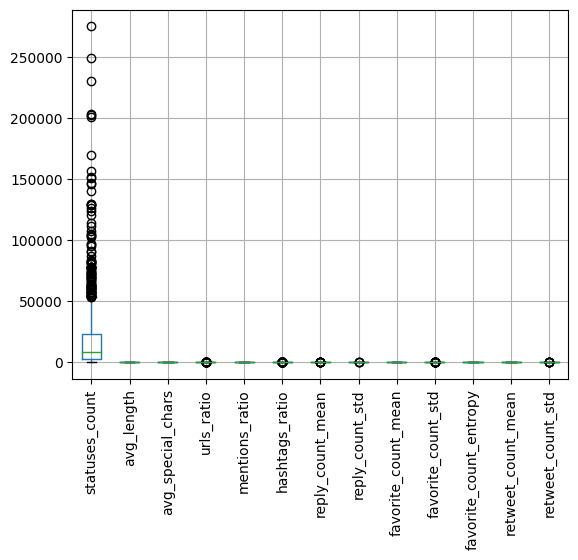

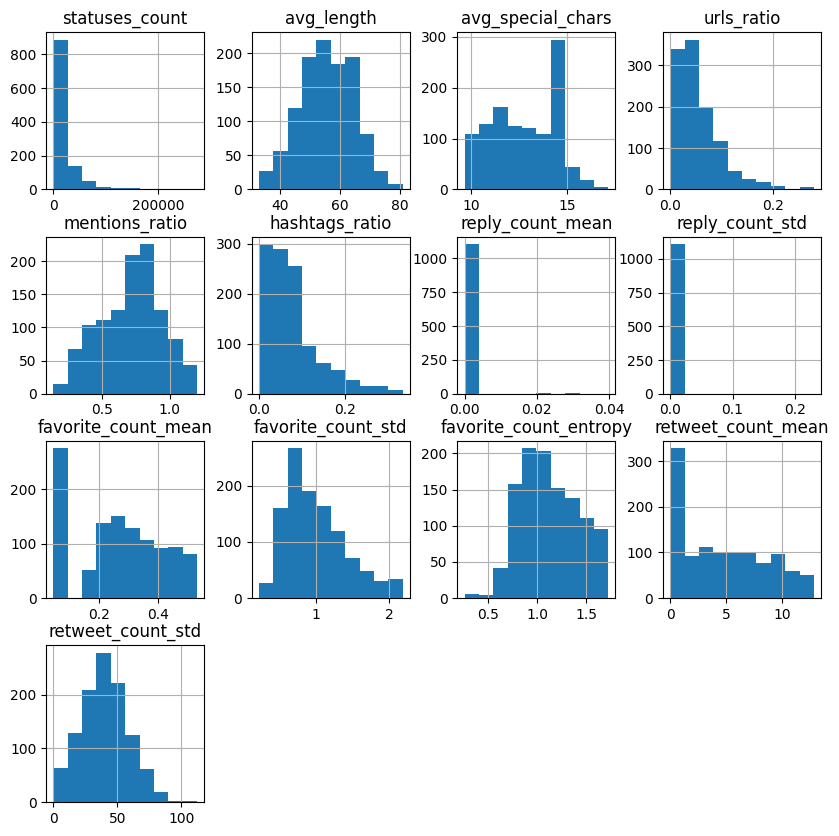

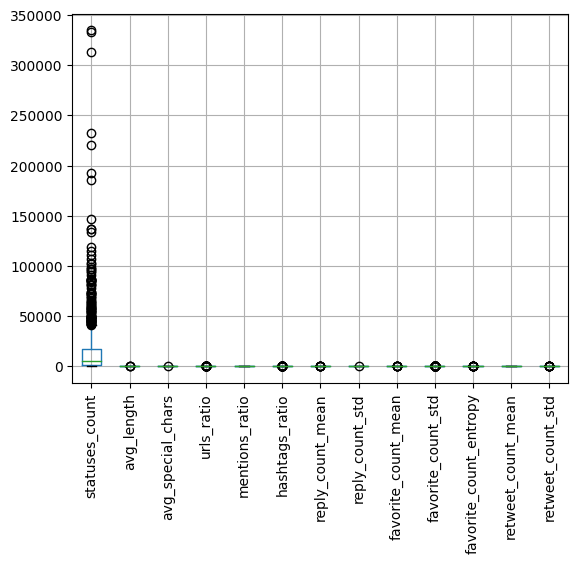

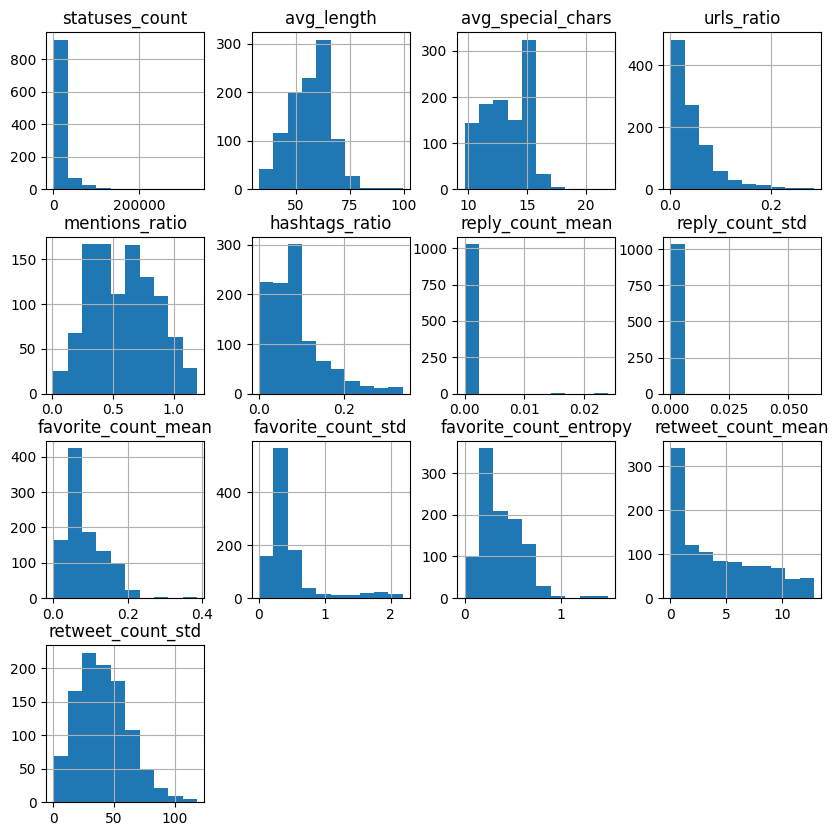

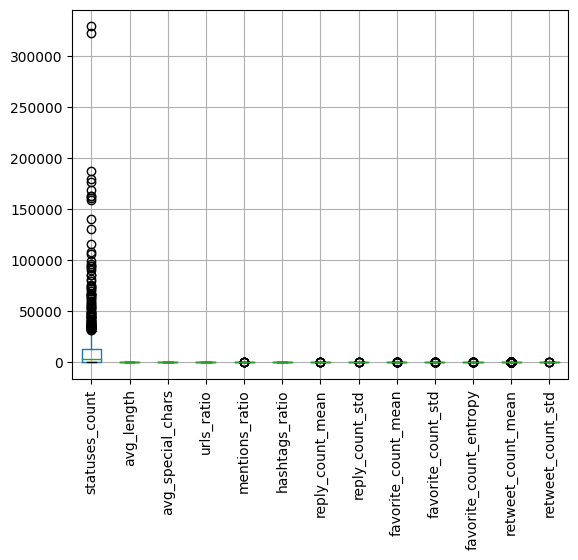

...

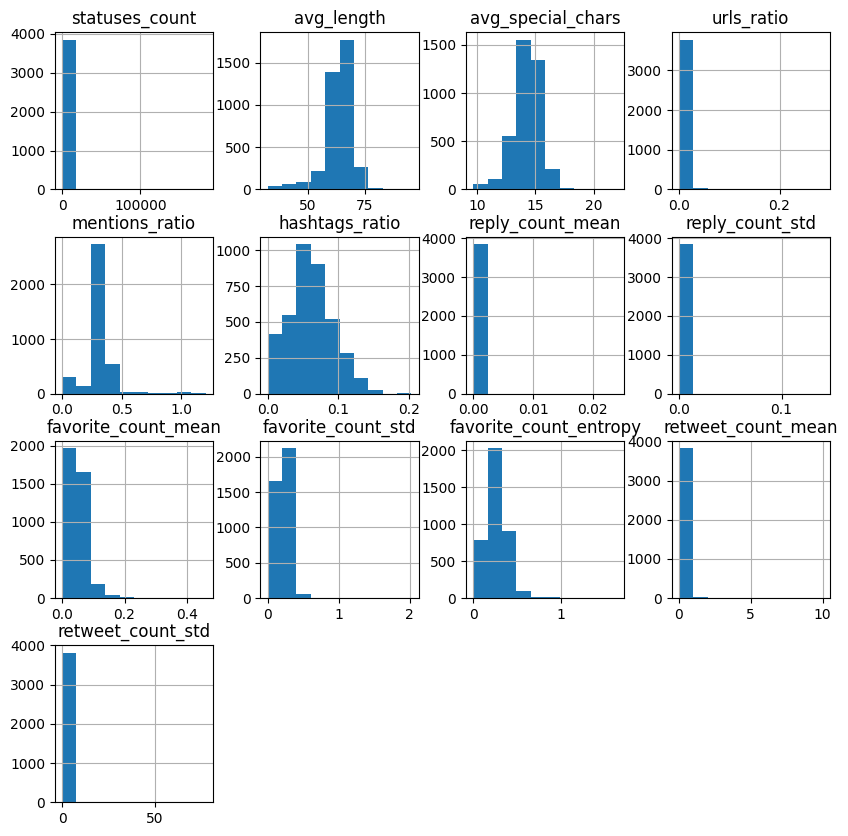

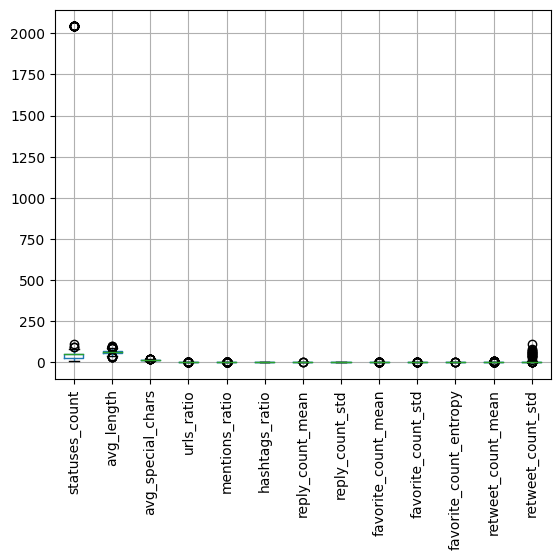

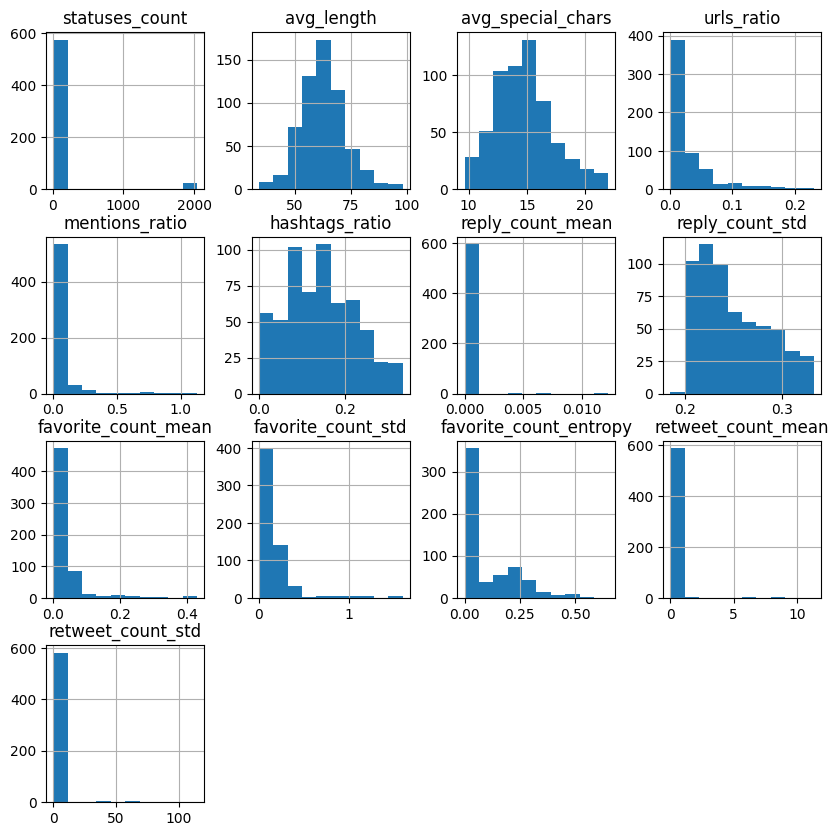

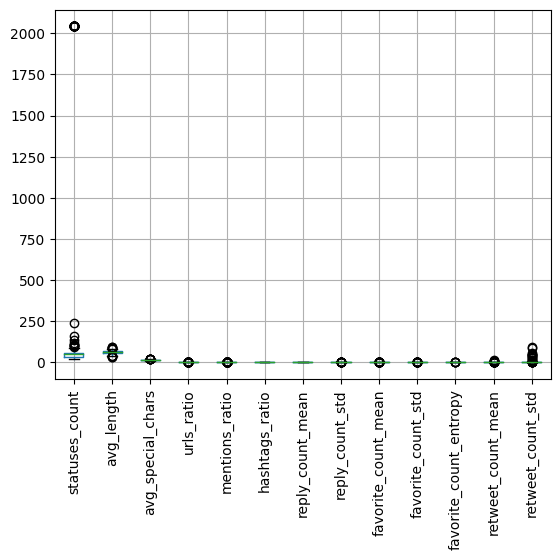

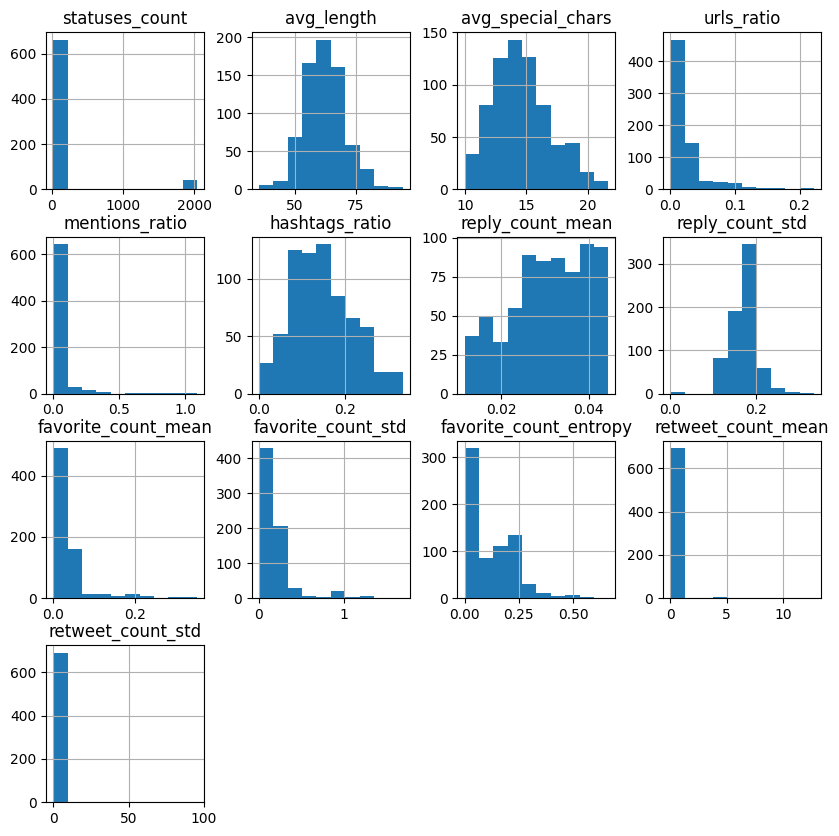

In [36]:
plot_numerical_features_clusters(df_num, som_labels, selected_k)

Plotting the scatter plot of each pair of numerical features, coloring out the points with respect the cluster number of each sample

statuses_count - avg_length


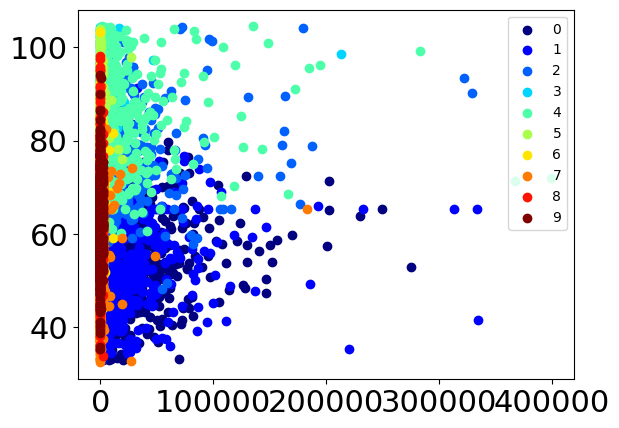

statuses_count - avg_special_chars


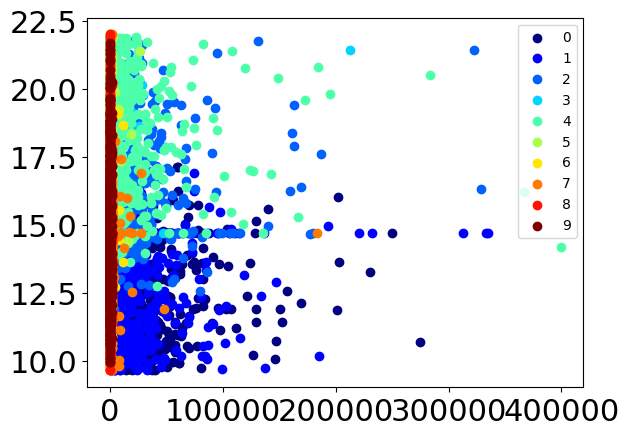

statuses_count - urls_ratio


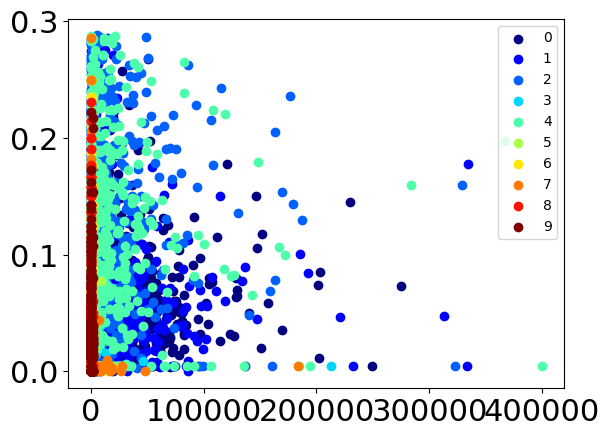

statuses_count - mentions_ratio


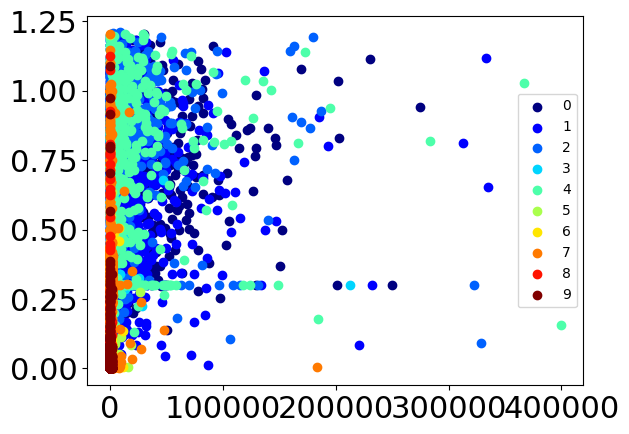

statuses_count - hashtags_ratio


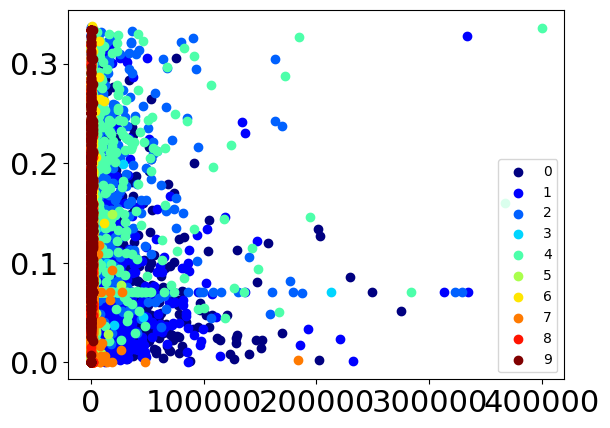

statuses_count - reply_count_mean


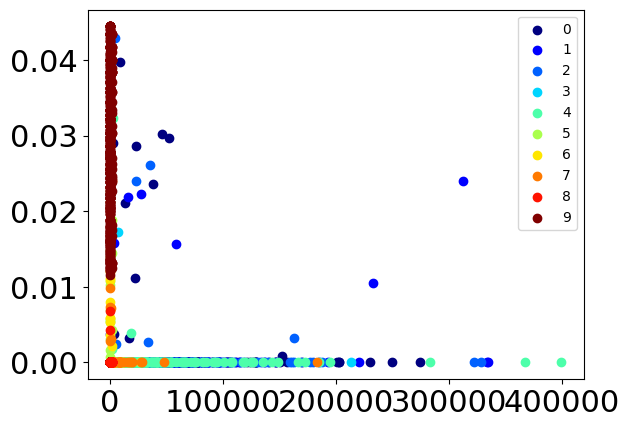

statuses_count - reply_count_std


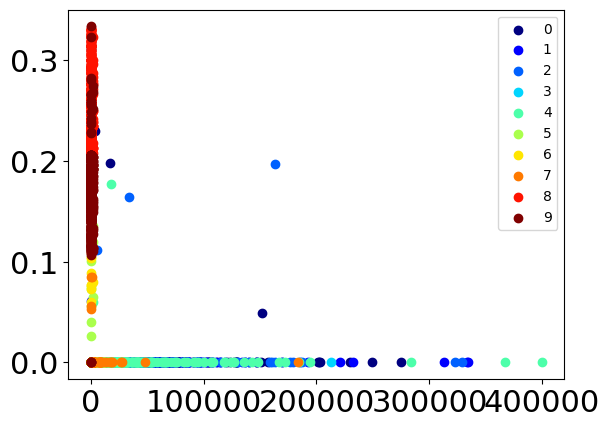

statuses_count - favorite_count_mean


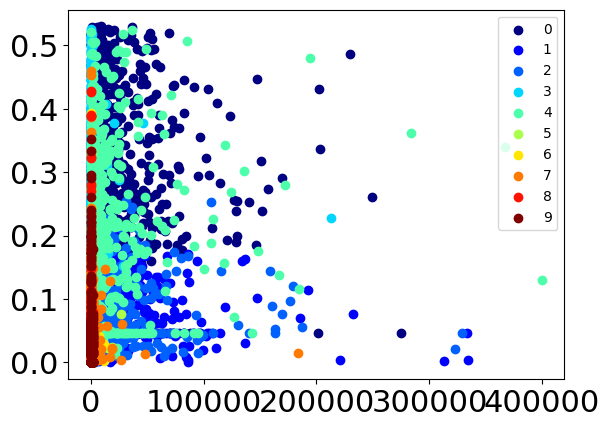

statuses_count - favorite_count_std


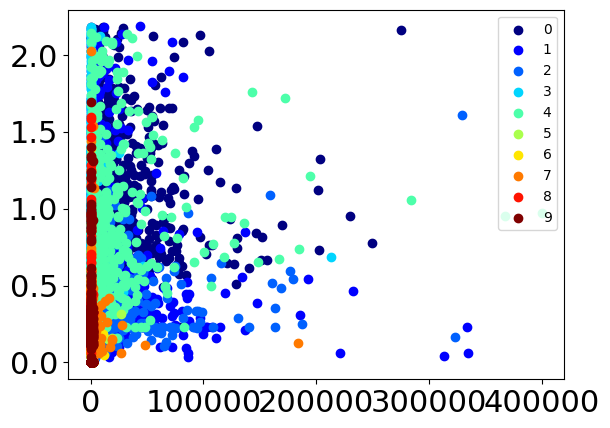

statuses_count - favorite_count_entropy


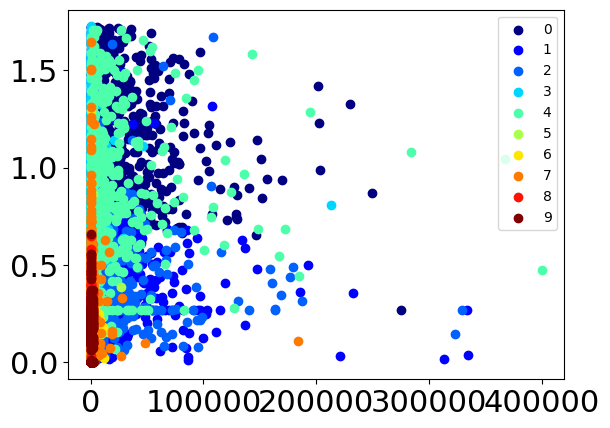

statuses_count - retweet_count_mean


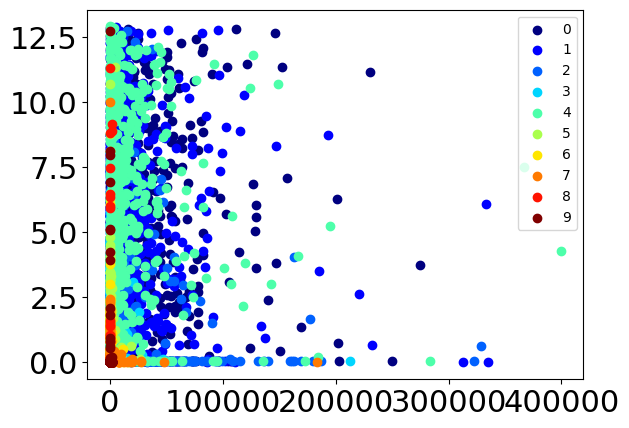

statuses_count - retweet_count_std


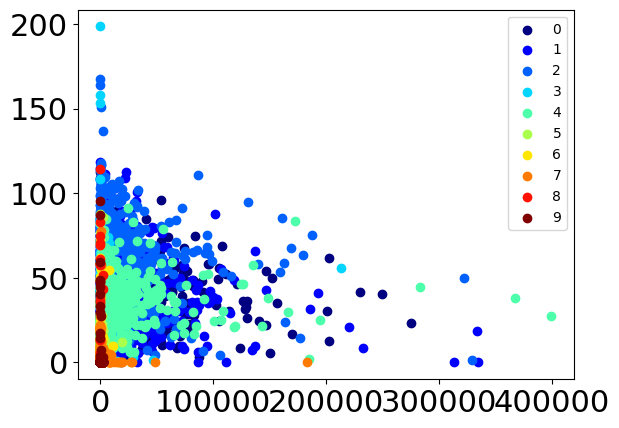

avg_length - avg_special_chars


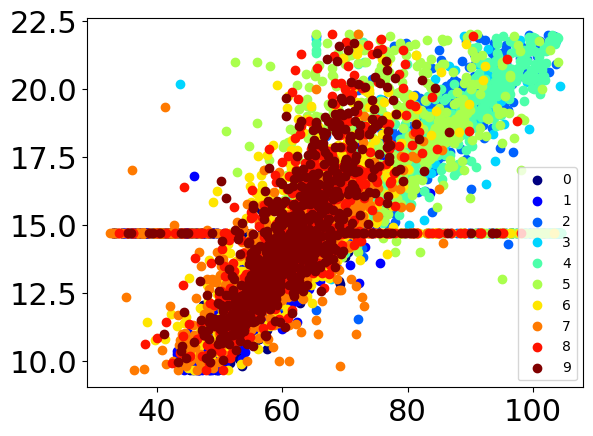

avg_length - urls_ratio


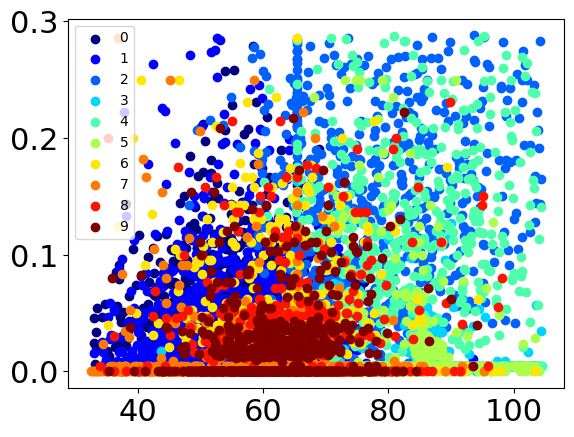

avg_length - mentions_ratio


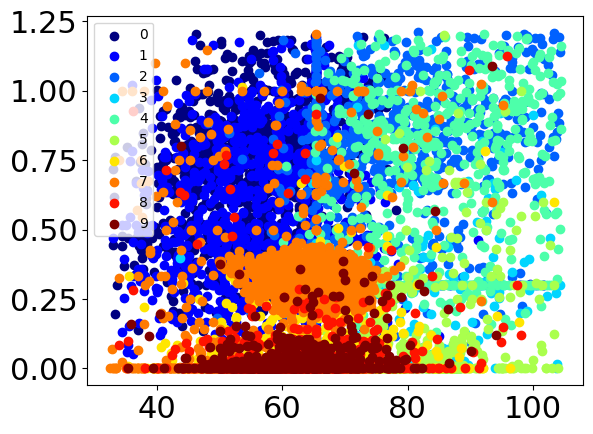

avg_length - hashtags_ratio


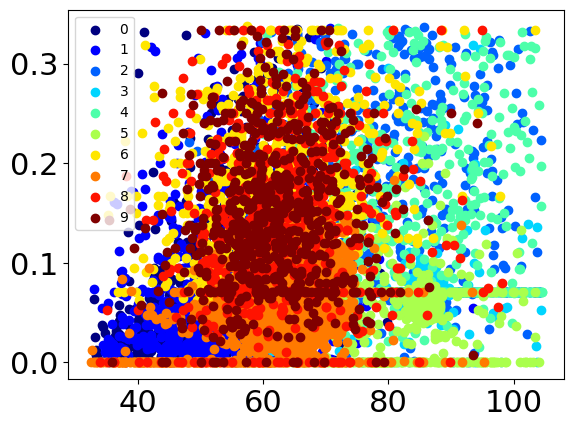

avg_length - reply_count_mean


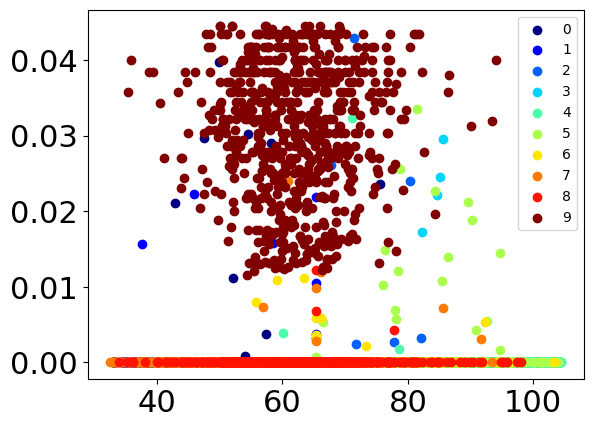

avg_length - reply_count_std


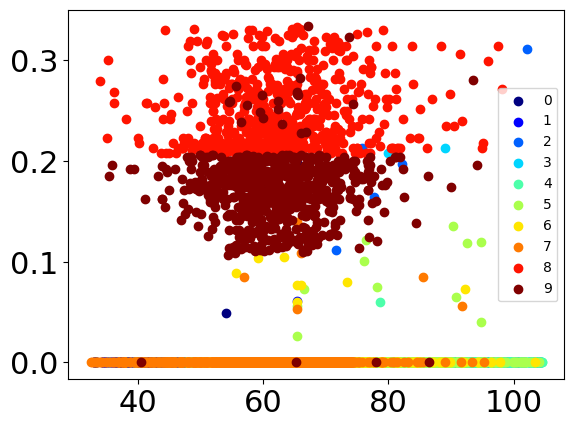

avg_length - favorite_count_mean


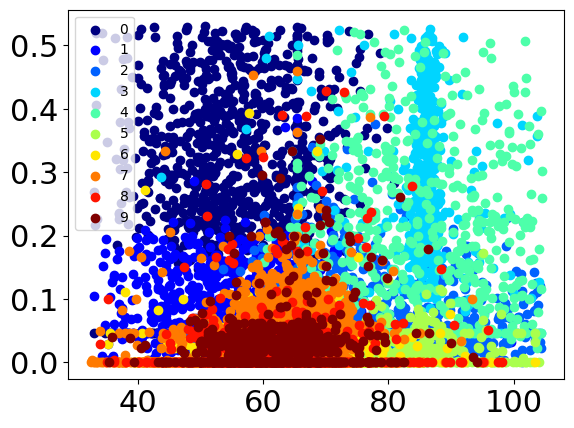

avg_length - favorite_count_std


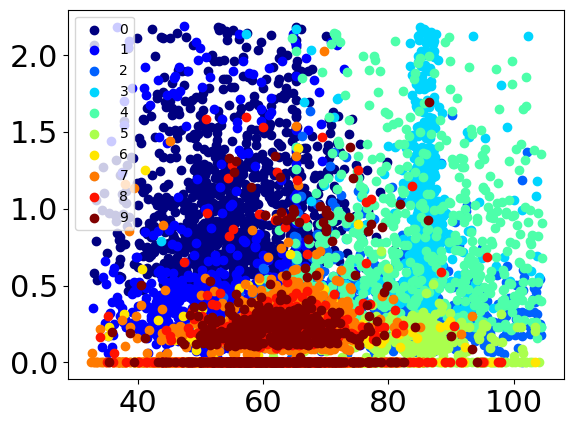

avg_length - favorite_count_entropy


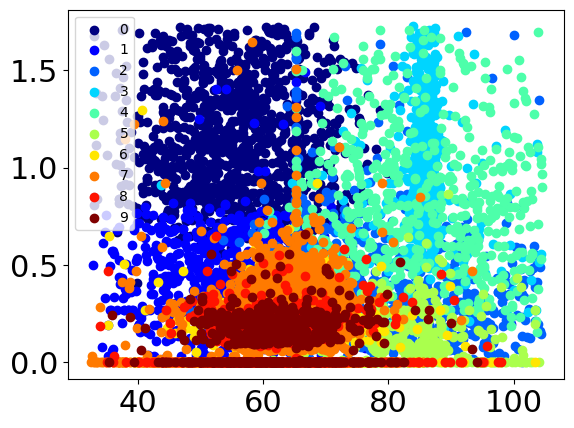

avg_length - retweet_count_mean


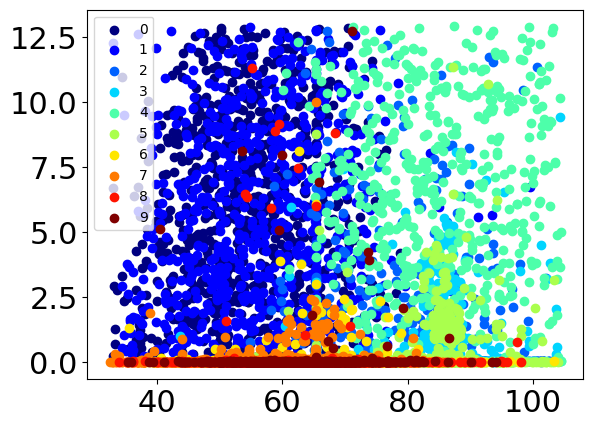

avg_length - retweet_count_std


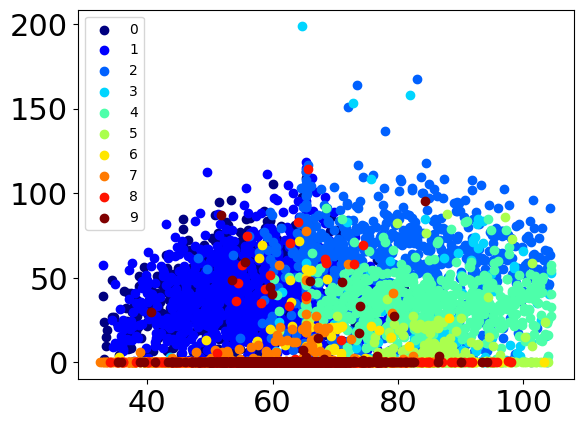

avg_special_chars - urls_ratio


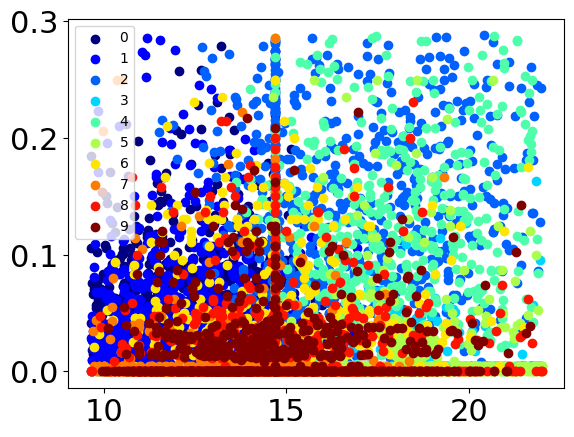

avg_special_chars - mentions_ratio


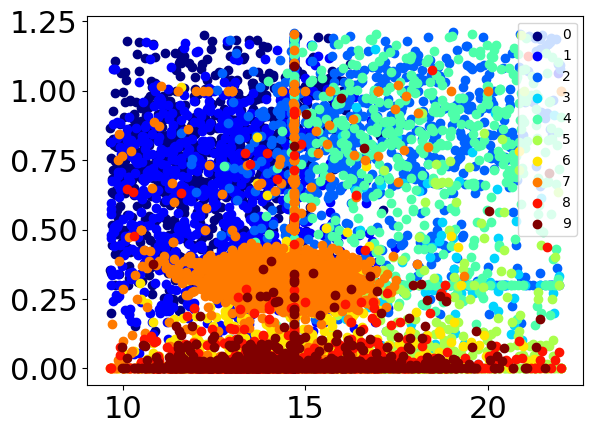

avg_special_chars - hashtags_ratio


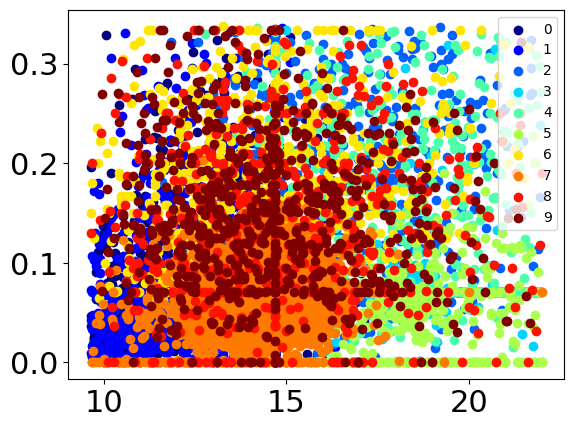

avg_special_chars - reply_count_mean


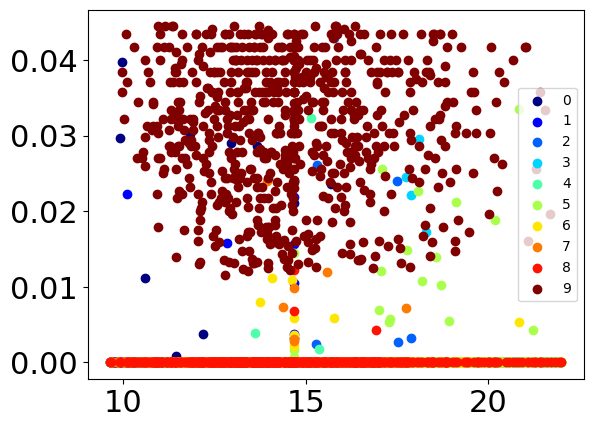

avg_special_chars - reply_count_std


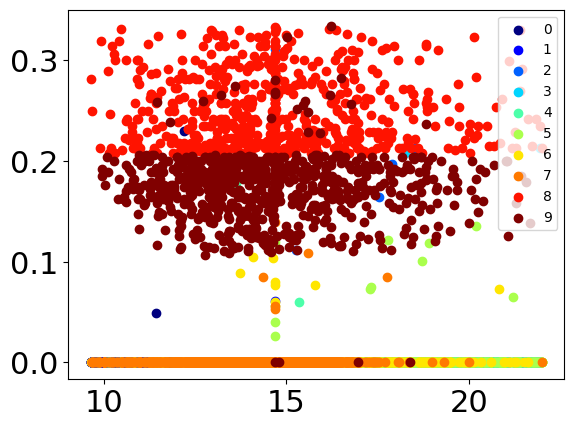

avg_special_chars - favorite_count_mean


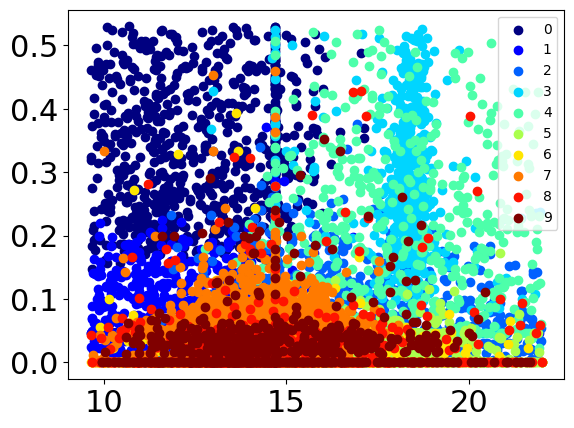

avg_special_chars - favorite_count_std


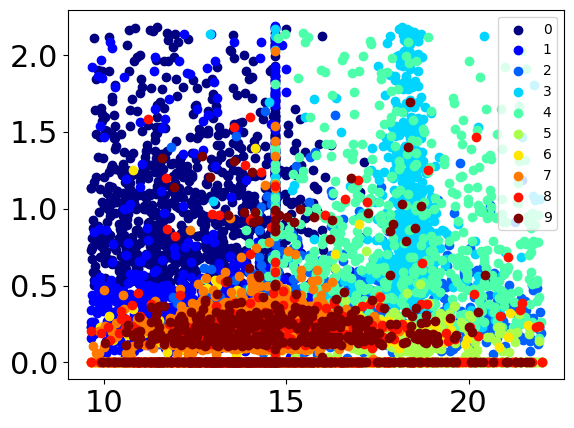

avg_special_chars - favorite_count_entropy


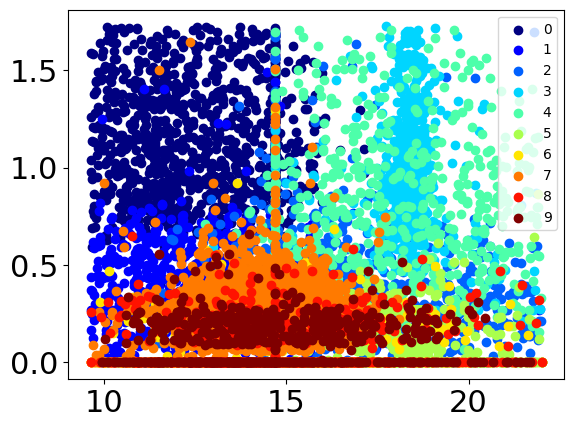

avg_special_chars - retweet_count_mean


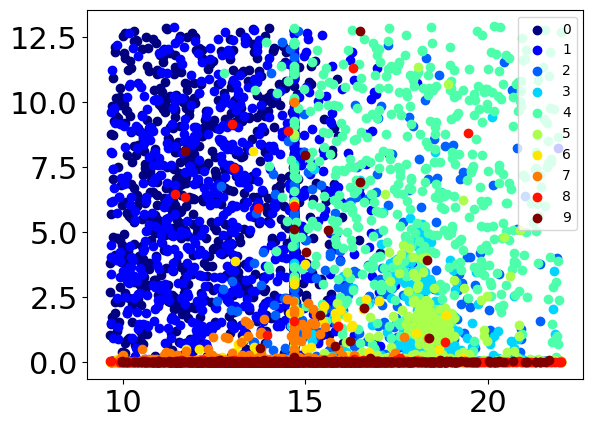

avg_special_chars - retweet_count_std


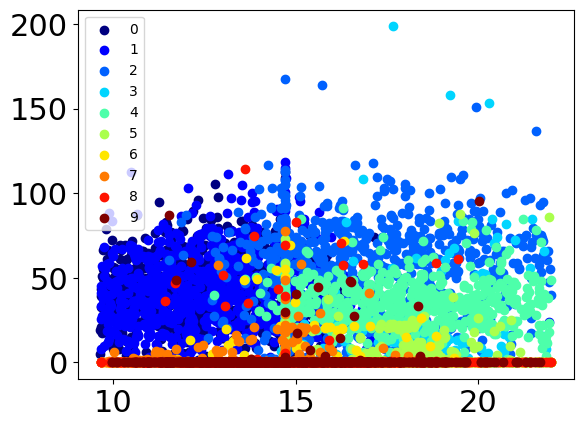

urls_ratio - mentions_ratio


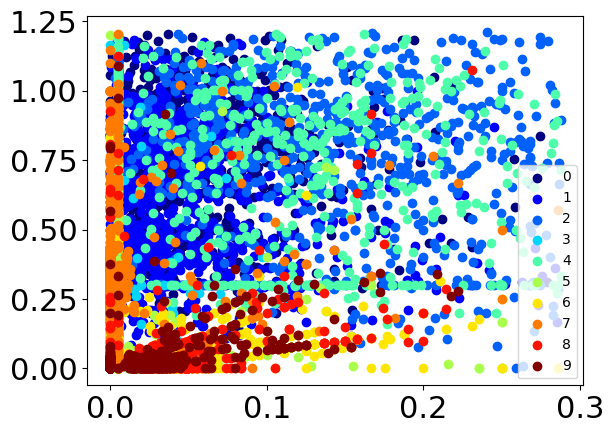

urls_ratio - hashtags_ratio


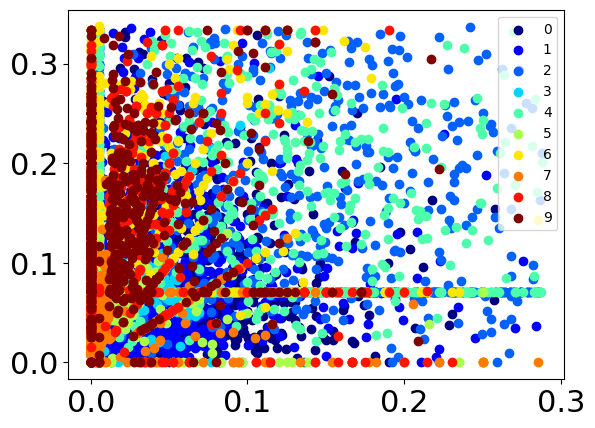

urls_ratio - reply_count_mean


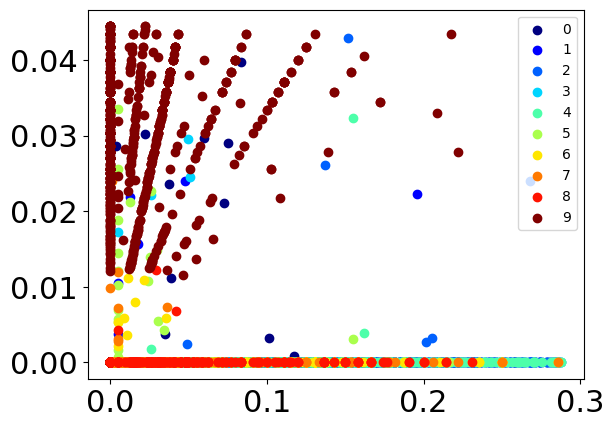

urls_ratio - reply_count_std


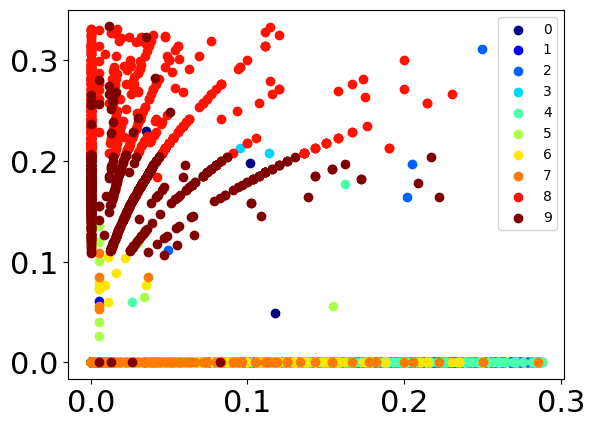

urls_ratio - favorite_count_mean


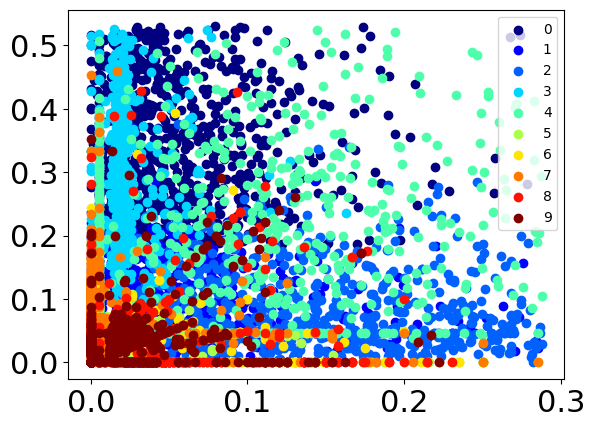

urls_ratio - favorite_count_std


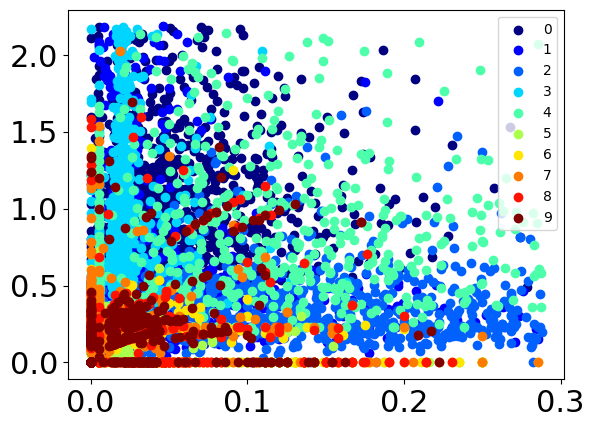

urls_ratio - favorite_count_entropy


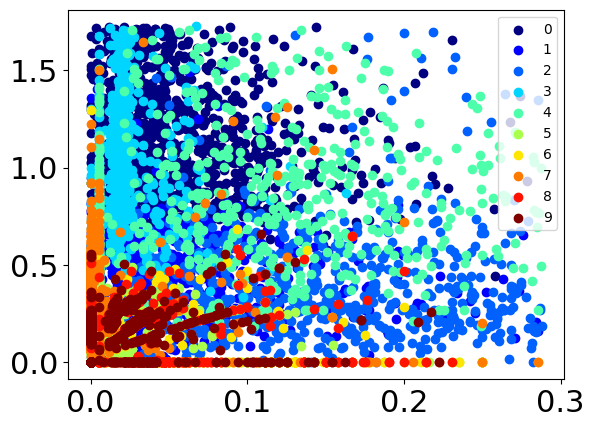

urls_ratio - retweet_count_mean


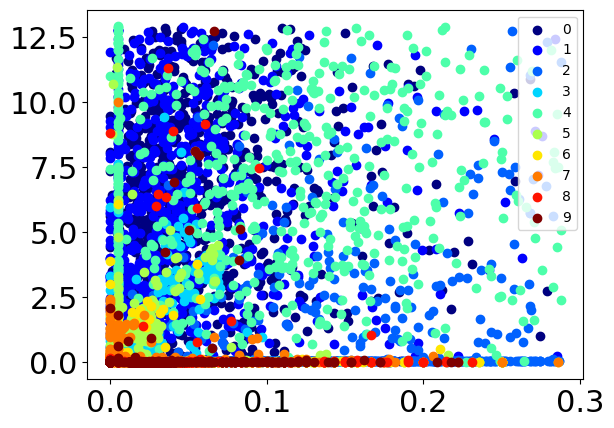

urls_ratio - retweet_count_std


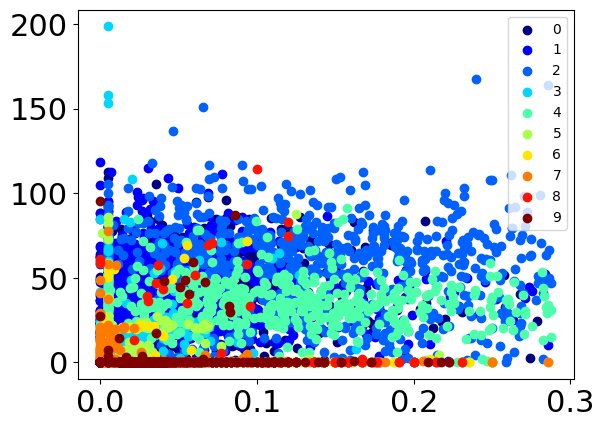

mentions_ratio - hashtags_ratio


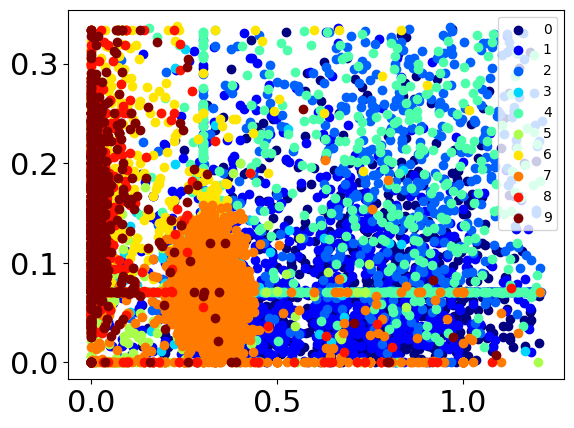

mentions_ratio - reply_count_mean


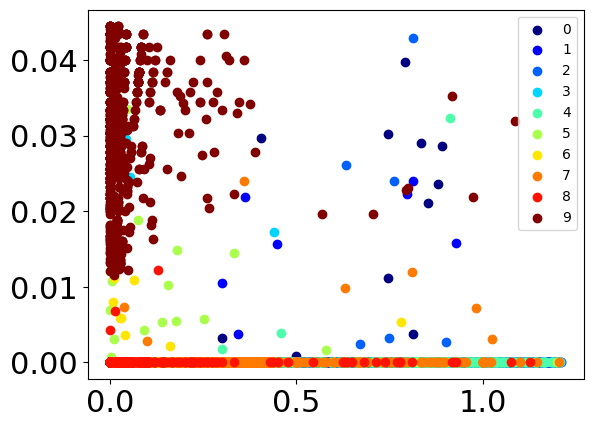

mentions_ratio - reply_count_std


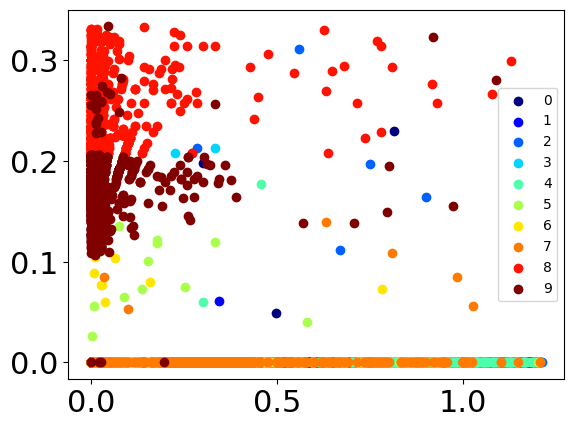

mentions_ratio - favorite_count_mean


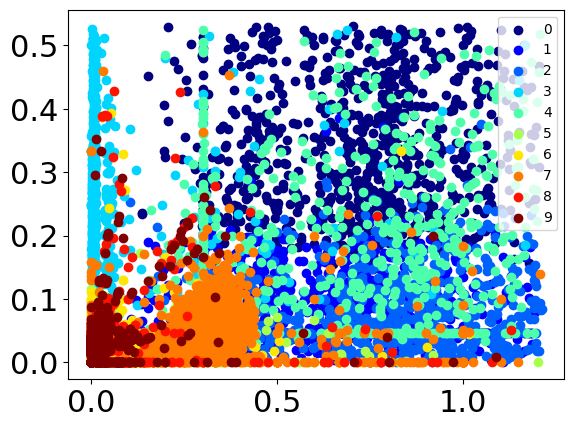

mentions_ratio - favorite_count_std


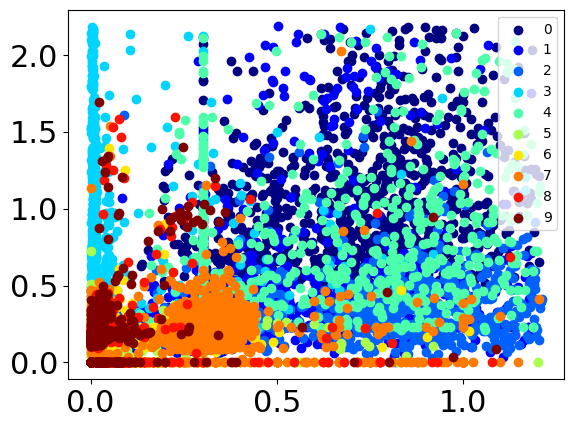

mentions_ratio - favorite_count_entropy


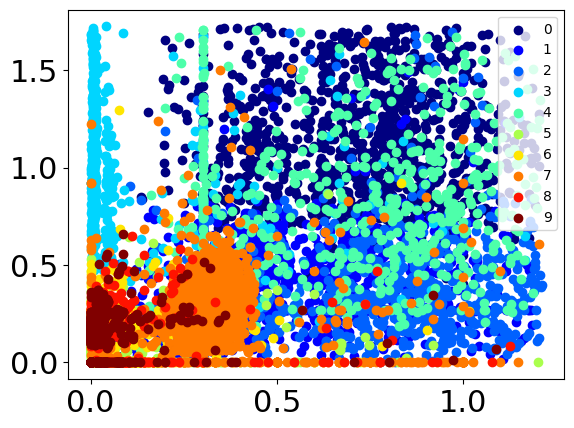

mentions_ratio - retweet_count_mean


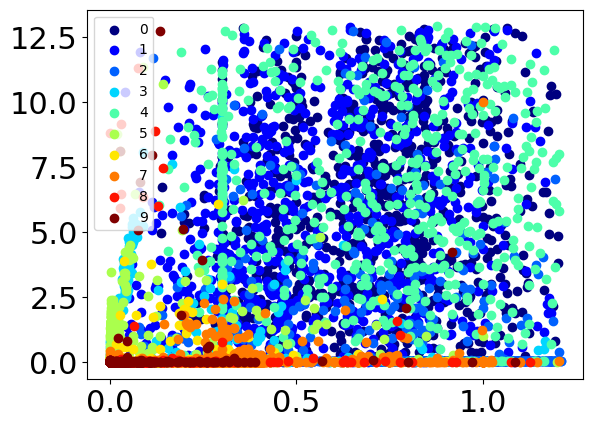

mentions_ratio - retweet_count_std


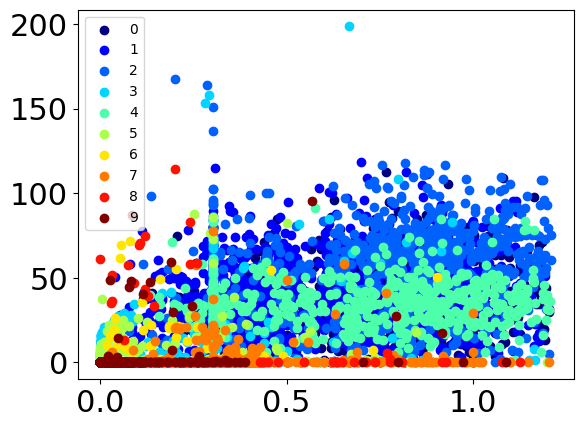

hashtags_ratio - reply_count_mean


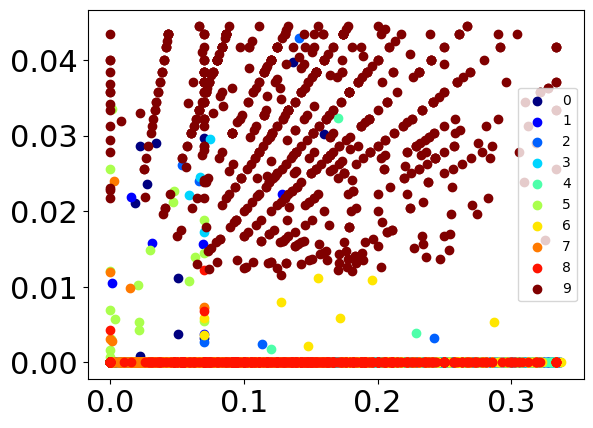

hashtags_ratio - reply_count_std


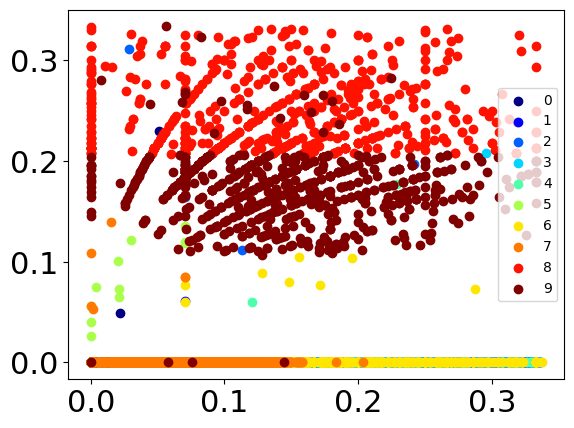

hashtags_ratio - favorite_count_mean


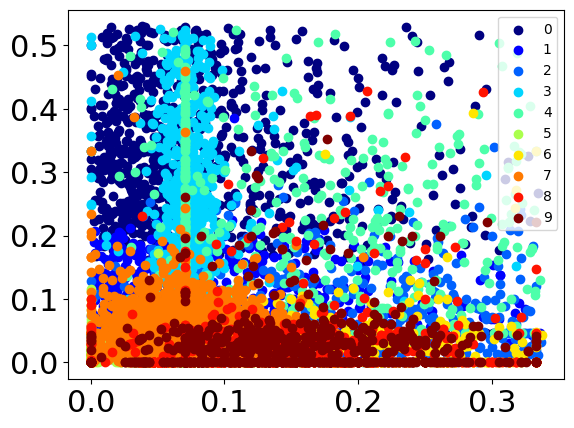

hashtags_ratio - favorite_count_std


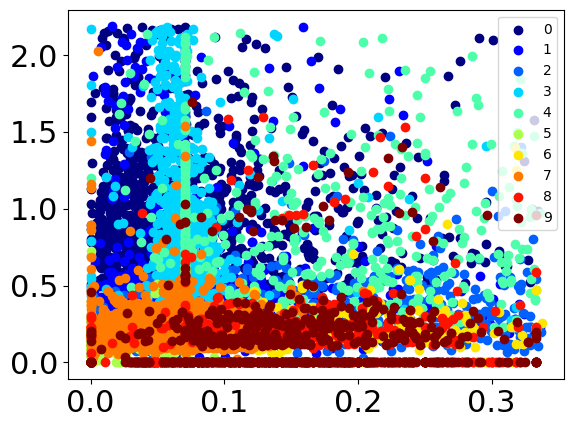

hashtags_ratio - favorite_count_entropy


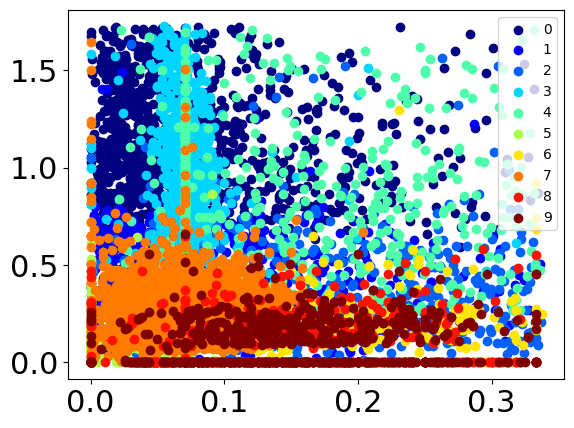

hashtags_ratio - retweet_count_mean


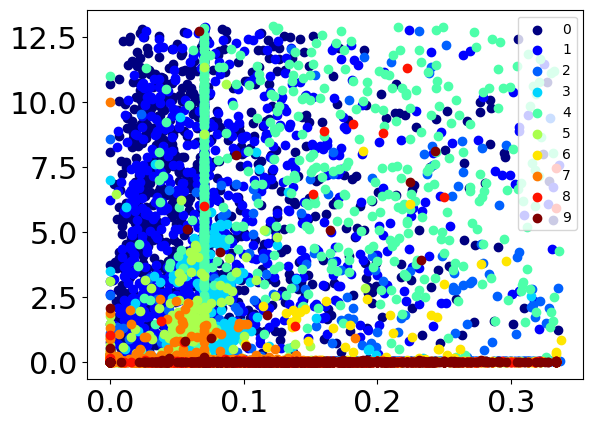

hashtags_ratio - retweet_count_std


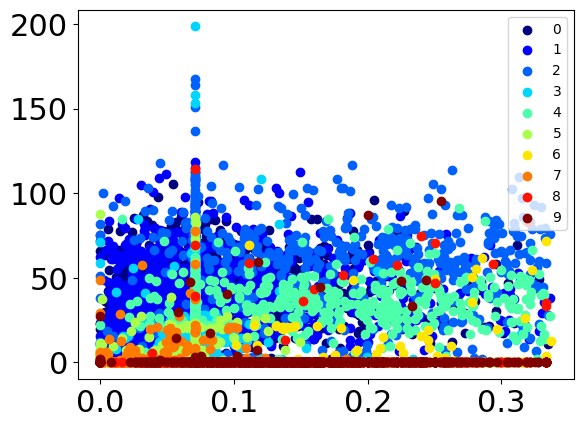

reply_count_mean - reply_count_std


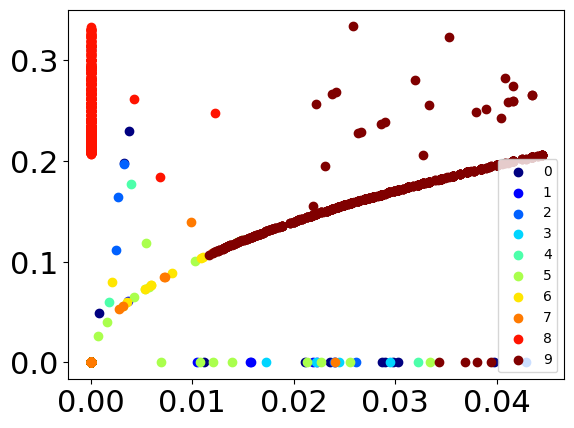

reply_count_mean - favorite_count_mean


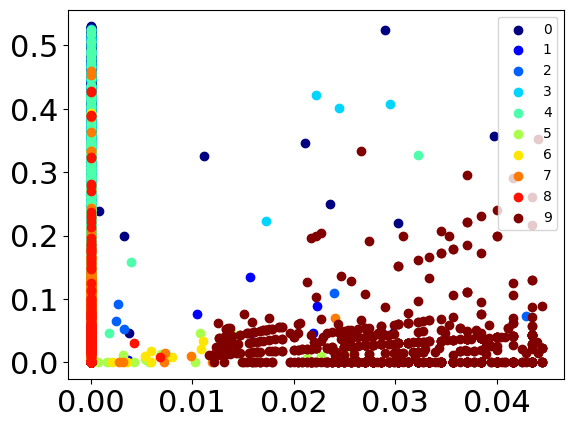

reply_count_mean - favorite_count_std


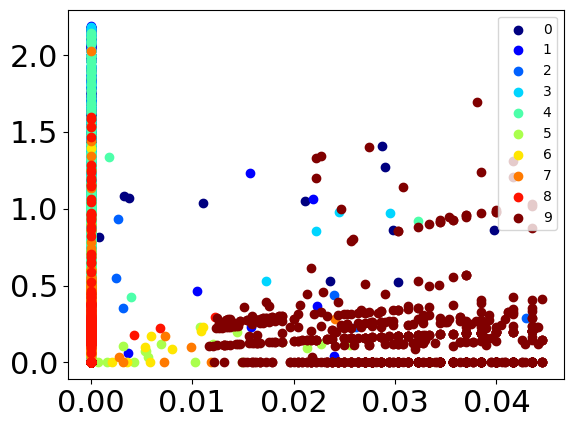

reply_count_mean - favorite_count_entropy


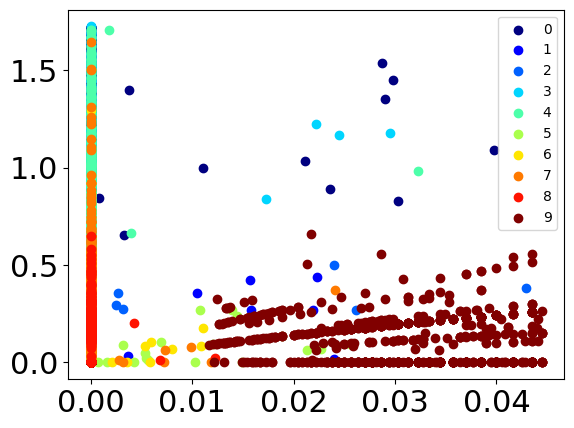

reply_count_mean - retweet_count_mean


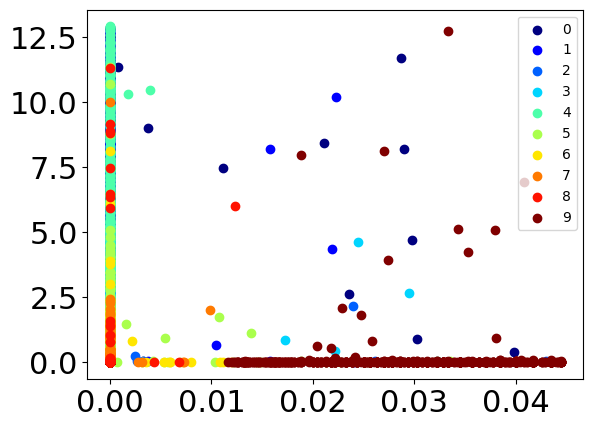

reply_count_mean - retweet_count_std


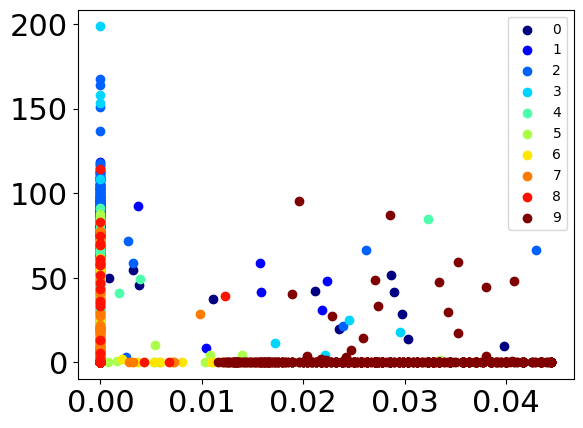

reply_count_std - favorite_count_mean


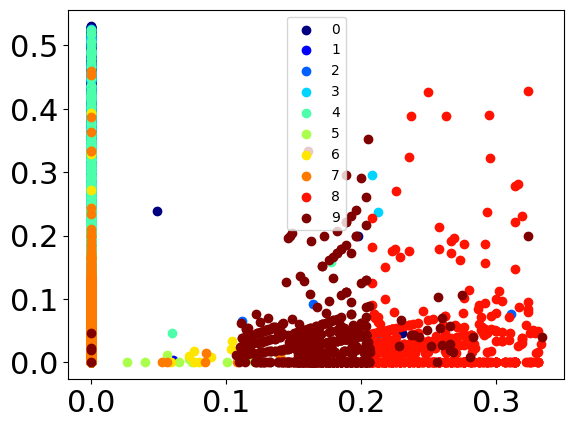

reply_count_std - favorite_count_std


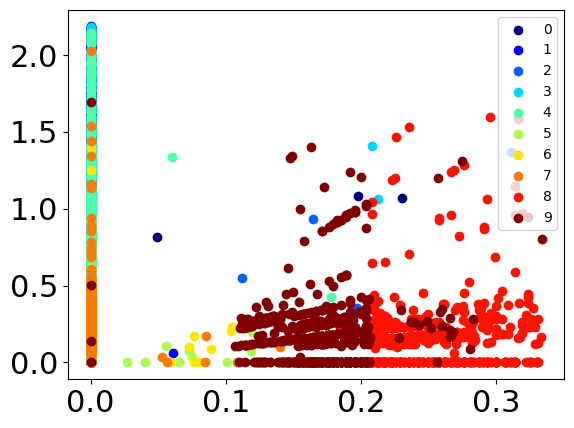

reply_count_std - favorite_count_entropy


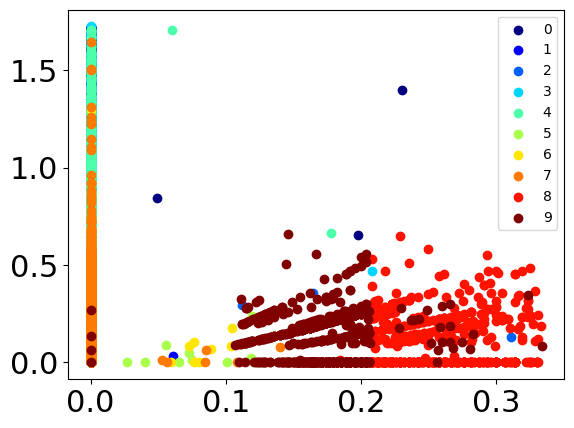

reply_count_std - retweet_count_mean


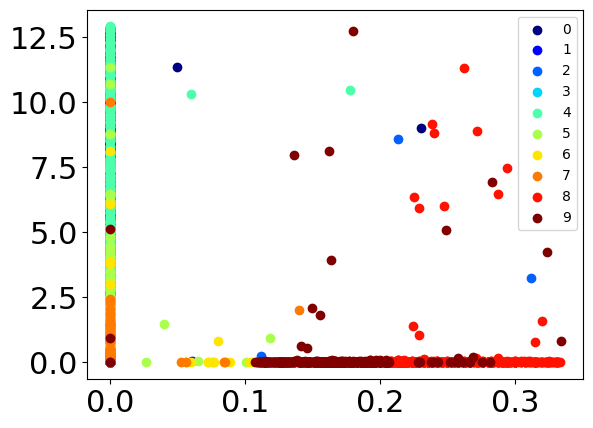

reply_count_std - retweet_count_std


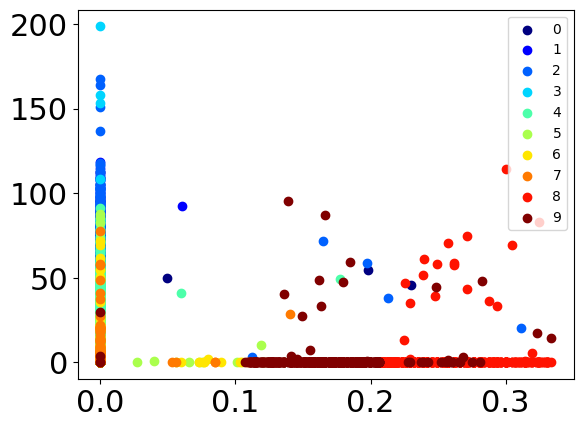

favorite_count_mean - favorite_count_std


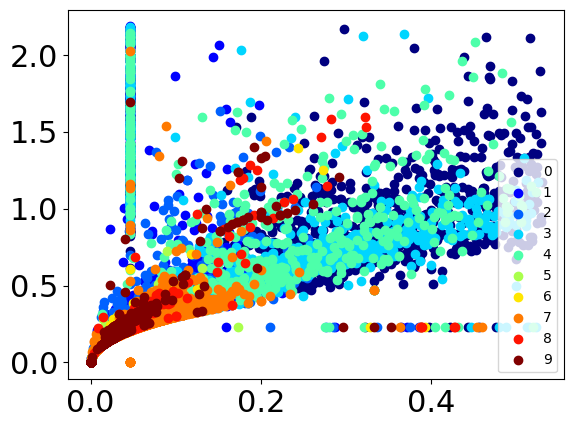

favorite_count_mean - favorite_count_entropy


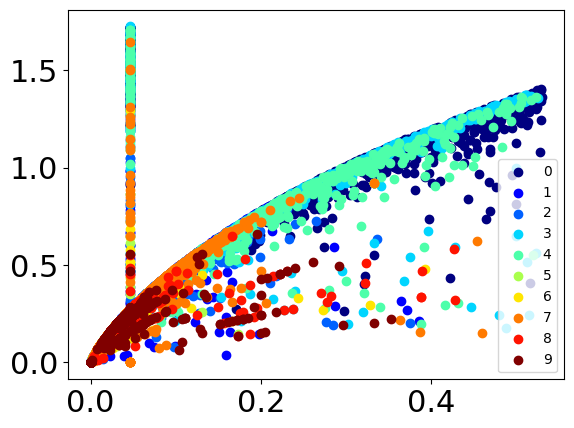

favorite_count_mean - retweet_count_mean


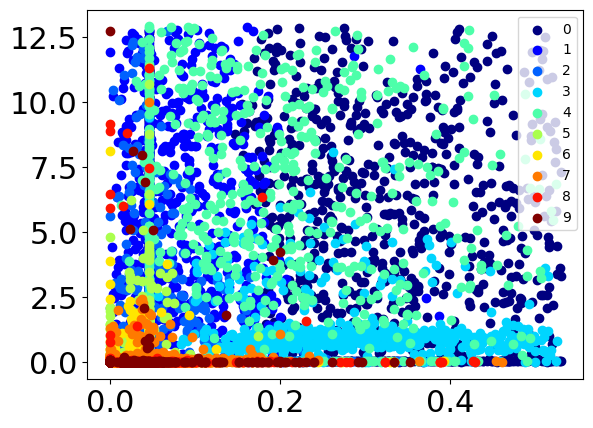

favorite_count_mean - retweet_count_std


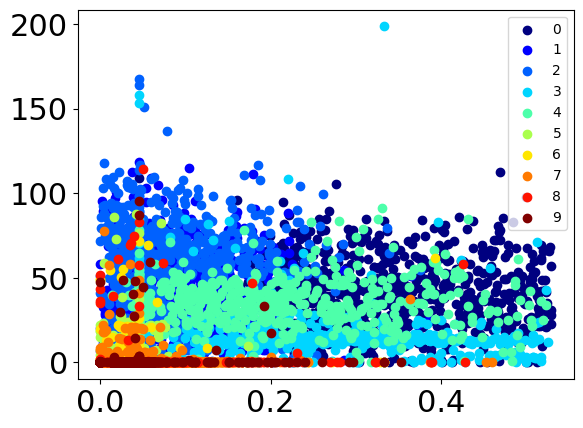

favorite_count_std - favorite_count_entropy


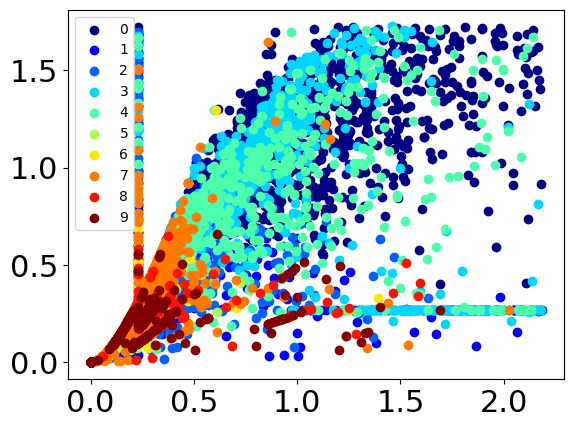

favorite_count_std - retweet_count_mean


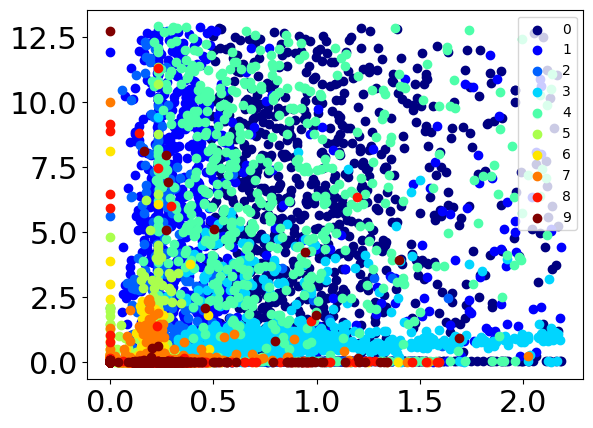

favorite_count_std - retweet_count_std


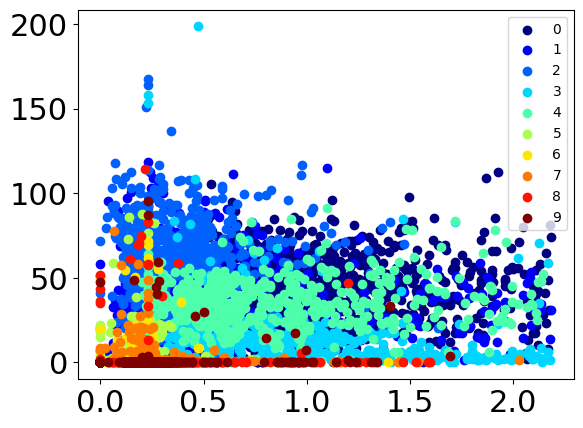

favorite_count_entropy - retweet_count_mean


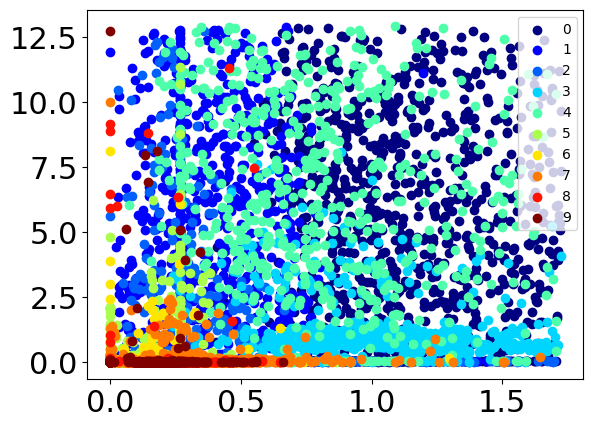

favorite_count_entropy - retweet_count_std


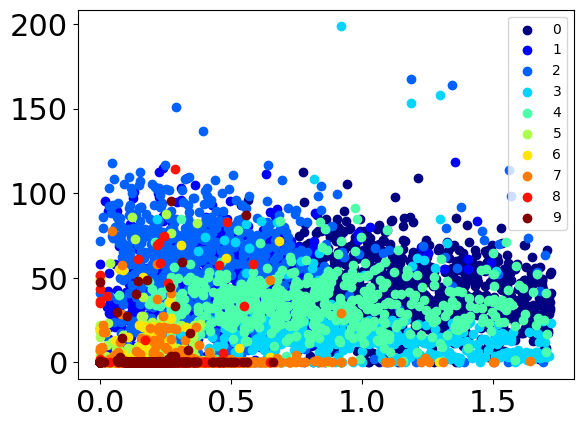

retweet_count_mean - retweet_count_std


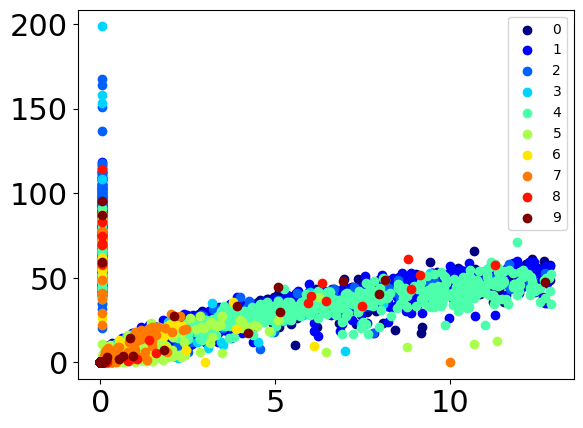

In [37]:
scatter_features_clusters(df_num, som_labels)

### PCA
Apply PCA to visualize the scatter plot distribution of the clustered data

In [38]:
pca = PCA(n_components=2)
X_reduced = pca.fit_transform(X)

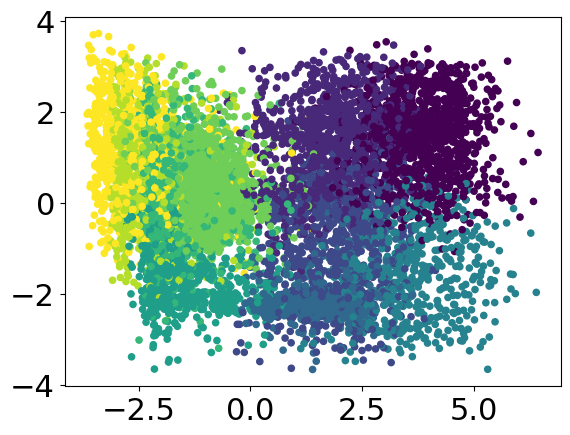

In [39]:
scatter = plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=som_labels, s=20)
plt.tick_params(axis='both', which='major', labelsize=22)
plt.savefig("images/clustering/som_pca.png")
plt.show()

### Evaluation KMeans

Print the SSE, Silouette and Separation of the method selected out.

In [40]:
print('SSE %s' % som_sse(somsc_instance, X, som_labels))
print('Silhouette %s' % silhouette_score(X, som_labels))
print('Separation %s' % metrics.davies_bouldin_score(X, som_labels))

SSE 53016.39574625684
Silhouette 0.28124818876922925
Separation 1.5857233055619608
